# **SKIN DISEASE CLASSIFICATION**

Deep learning to predict the various skin diseases. The main objective of this project is to achieve maximum accuracy of skin disease prediction.
Deep learning techniques helps in detection of skin disease at an initial stage. The feature extraction plays a key role in classification of skin diseases.The usage of Deep Learning algorithms reduces the need for human labor, such as manual feature extraction and data reconstruction for classification purpose.
Moreover, Explainable AI is used to interpret the decisions made by our model.

## ABOUT THE DATASET

HAM10000 ("Human Against Machine with 10000 training images") dataset - a large collection of multi-source dermatoscopic images of pigmented lesions

The dermatoscopic images are collected from different populations, acquired and stored by different modalities. The final dataset consists of 10015 dermatoscopic images.

It has 7 different classes of skin cancer which are listed below :
- Melanocytic nevi
- Melanoma
- Benign keratosis-like lesions
- Basal cell carcinoma
- Actinic keratoses
- Vascular lesions
- Dermatofibroma


In [1]:
#Importing required libraries
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import numpy as np
import pandas as pd
import os
from tensorflow.keras.utils import to_categorical
from glob import glob

HAM10000_metadata.csv file is the main csv file that includes the data of all training images, the features of which are -
 
1. Lesion_id
2. Image_id
3. Dx
4. Dx_type
5. Age
6. Sex
7. Localization


In [2]:
# Reading the data from HAM_metadata.csv
df = pd.read_csv('../input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')

In [3]:
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [4]:
df.dtypes

lesion_id        object
image_id         object
dx               object
dx_type          object
age             float64
sex              object
localization     object
dtype: object

In [5]:
df.describe()

,age
count,9958.000000
mean,51.863828
std,16.968614
min,0.000000
25%,40.000000
50%,50.000000
75%,65.000000
max,85.000000


A general statistical analysis of the numerical values of dataset (here : age)

## **Data Cleaning**

### Removing NULL values and performing visualizations to gain insights of dataset: Univariate and Bivariate Analysis

In [6]:
df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
dtype: int64

The feature 'age' consists of 57 null records. Thus, we need to replace them with the mean of 'age' since dropping 57 records would lead to loss of data.

In [7]:
df['age'].fillna(int(df['age'].mean()),inplace=True)

<ipython-input-7-951484299878>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['age'].fillna(int(df['age'].mean()),inplace=True)


In [8]:
df.isnull().sum()

lesion_id       0
image_id        0
dx              0
dx_type         0
age             0
sex             0
localization    0
dtype: int64

Now, the null values have been removed.

In [9]:
lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}
base_skin_dir = '../input/skin-cancer-mnist-ham10000'

# Merge images from both folders into one dictionary

imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}

In [10]:
df['path'] = df['image_id'].map(imageid_path_dict.get)
df['cell_type'] = df['dx'].map(lesion_type_dict.get) 
df['cell_type_idx'] = pd.Categorical(df['cell_type']).codes
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   lesion_id      10015 non-null  object 
 1   image_id       10015 non-null  object 
 2   dx             10015 non-null  object 
 3   dx_type        10015 non-null  object 
 4   age            10015 non-null  float64
 5   sex            10015 non-null  object 
 6   localization   10015 non-null  object 
 7   path           10015 non-null  object 
 8   cell_type      10015 non-null  object 
 9   cell_type_idx  10015 non-null  int8   
dtypes: float64(1), int8(1), object(8)
memory usage: 714.1+ KB


In [12]:
df['cell_type'].unique()

array(['Benign keratosis-like lesions ', 'Melanocytic nevi',
       'Dermatofibroma', 'Melanoma', 'Vascular lesions',
       'Basal cell carcinoma', 'Actinic keratoses'], dtype=object)

In [13]:
df['dx'].unique()

array(['bkl', 'nv', 'df', 'mel', 'vasc', 'bcc', 'akiec'], dtype=object)

In [14]:
df['cell_type'].value_counts()


cell_type
Melanocytic nevi                  6705
Melanoma                          1113
Benign keratosis-like lesions     1099
Basal cell carcinoma               514
Actinic keratoses                  327
Vascular lesions                   142
Dermatofibroma                     115
Name: count, dtype: int64

In [15]:
df['cell_type_idx'].value_counts()

cell_type_idx
4    6705
5    1113
2    1099
1     514
0     327
6     142
3     115
Name: count, dtype: int64

In [16]:
df= df[df['age'] != 0]
df= df[df['sex'] != 'unknown']

## **Image Preprocessing**

### Resizing of images because the original dimensions of 450 * 600 * 3 take long time to process in Neural Networks

In [17]:
#Step 1: Import Required Libraries
import torch
from torch.utils.data import Dataset, DataLoader,random_split
from torchvision import transforms
from PIL import Image


In [10]:
# Load the entire dataset
#dataset = datasets.ImageFolder(root='./images', transform=transform)

In [ ]:
# CIFAR-10 dataset
#train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
#test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

**Define the Custom Dataset Class**

We’ll create a class called SkinCancerDataset that inherits from torch.utils.data.Dataset.

In [18]:
class SkinCancerDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        """
        Args:
            dataframe (pd.DataFrame): DataFrame containing image paths and labels.
            transform (callable, optional): Optional transform to be applied on an image.
        """
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        """Returns the total number of samples."""
        return len(self.dataframe)

    def __getitem__(self, idx):
        """
        Args:
            idx (int): Index of the sample to fetch.
        Returns:
            image (torch.Tensor): Transformed image.
            label (int): Corresponding label.
        """
        # Get the image path and label for the given index
        img_path = self.dataframe.iloc[idx]['path']
        label = self.dataframe.iloc[idx]['cell_type_idx']

        # Load the image using PIL
        image = Image.open(img_path).convert('RGB')  # Ensure 3 channels (RGB)

        # Apply transformations (if any)
        if self.transform:
            image = self.transform(image)

        # Convert label to a tensor
        label = torch.tensor(label, dtype=torch.long)

        return image, label

# **Mean and SD**

In [19]:
from torchvision import transforms
from torch.utils.data import DataLoader
import torch

# Define dataset transformation (only ToTensor, no normalization)
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()  # Converts images to [0,1] range
])

# Load dataset
dataset = SkinCancerDataset(df, transform=transform)
loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)

# Initialize variables
mean = torch.zeros(3)
std = torch.zeros(3)
num_samples = 0

# Compute mean & std over all dataset
for images, _ in loader:
    batch_samples = images.size(0)  # Number of images in batch
    num_samples += batch_samples

    # Compute per-batch mean & std
    batch_mean = images.mean(dim=[0, 2, 3])  # Mean over [batch, height, width]
    batch_std = images.std(dim=[0, 2, 3])  # Std over [batch, height, width]

    # Weighted sum
    mean += batch_mean * batch_samples
    std += batch_std * batch_samples

# Final mean and std
mean /= num_samples
std /= num_samples

print(f"Dataset Mean: {mean.numpy()}")
print(f"Dataset Std: {std.numpy()}")


Dataset Mean: [0.76414263 0.5458463  0.56987756]
Dataset Std: [0.11773212 0.14170761 0.1573846 ]


**Create Dataset and DataLoader**

Now, let’s create an instance of the SkinCancerDataset class and wrap it in a DataLoader for batching and shuffling.

In [19]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize images to 128x128
    transforms.ToTensor(),           # Convert PIL image to PyTorch tensor
    transforms.Normalize(mean=[0.76414263,0.5458463,0.56987756], std=[0.11773212,0.14170761,0.1573846])
])

In [20]:
# Create the dataset
dataset = SkinCancerDataset(dataframe=df,transform=transform)

# Define the split ratio (e.g., 80% train, 20% validation)
train_size = int(0.8 * len(dataset))  # 80% of data
val_size = len(dataset) - train_size  # Remaining 20%

# Split the dataset
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Create the DataLoader
batch_size = 32  # You can adjust this based on your GPU memory
shuffle = True   # Shuffle the data for training
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

**Verify the Dataset and DataLoader**

Let’s test the dataset and dataloader to ensure everything is working correctly.

In [21]:
# Test the dataset
sample_image, sample_label = dataset[0]
print(f"Image shape: {sample_image.shape}")  # Should be [3, 128, 128]
print(f"Label: {sample_label}")             # Should be an integer (0-6)

# Test the DataLoader
for images, labels in train_loader:
    print(f"Batch of images shape: {images.shape}")  # Should be [batch_size, 3, 128, 128]
    print(f"Batch of labels: {labels}")             # Should be a tensor of labels
    break  # Stop after the first batch for testing


Image shape: torch.Size([3, 128, 128])
Label: 2
Batch of images shape: torch.Size([32, 3, 128, 128])
Batch of labels: tensor([4, 4, 4, 4, 5, 2, 0, 4, 5, 4, 2, 4, 4, 4, 4, 2, 4, 5, 4, 4, 4, 4, 1, 4,
        4, 4, 4, 5, 5, 5, 5, 4])


# **ANN** 

In [23]:
import torch.nn as nn

class SimpleANN(nn.Module):
    def __init__(self):
        """
        Hardcoded ANN model with fully connected layers.
        """
        super(SimpleANN, self).__init__()

        self.network = nn.Sequential(
          nn.Flatten(),  # Flatten before feeding into Linear layers
          nn.Linear(128 * 128 * 3, 128),
          nn.ReLU(),
          nn.Linear(128, 64),
          nn.ReLU(),
          nn.Linear(64, 7)
)

    def forward(self, x):
        """
        Defines the forward pass.
        """
        return self.network(x)

In [24]:
# Initialize the model
model = SimpleANN()
print(model)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

SimpleANN(
  (network): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=49152, out_features=128, bias=True)
    (2): ReLU()
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=7, bias=True)
  )
)


SimpleANN(
  (network): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=49152, out_features=128, bias=True)
    (2): ReLU()
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=7, bias=True)
  )
)

In [25]:
import torch.optim as optim

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()  # Combines LogSoftmax and NLLLoss
optimizer = optim.Adam(model.parameters(), lr=0.001)  # Learning rate can be adjusted

In [26]:
def train_model(model, train_loader,val_loader, criterion, optimizer, num_epochs=10):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []
    
    for epoch in range(num_epochs):
        model.train()  # Set model to training mode
        total_loss = 0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)  # Move data to GPU

            optimizer.zero_grad()  # Clear previous gradients
            outputs = model(images)  # Flatten images
            loss = criterion(outputs, labels)  # Compute loss

            loss.backward()  # Backpropagation
            optimizer.step()  # Update weights

            total_loss += loss.item()
            _, predicted = torch.max(outputs, 1)  # Get predicted labels
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

        train_loss = total_loss / len(train_loader)
        train_acc = correct / total * 100
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        ### Validation Phase ###
        model.eval()  # Set model to evaluation mode
        val_loss, correct_val, total_val = 0, 0, 0

        with torch.no_grad():  # No gradient calculation for validation
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                correct_val += (predicted == labels).sum().item()
                total_val += labels.size(0)

        val_loss = val_loss / len(val_loader)
        val_acc = (correct_val / total_val) * 100
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        print(f"Epoch [{epoch+1}/{num_epochs}] → "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}% | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

    print("Training Complete!")
    return train_losses, val_losses, train_accuracies, val_accuracies

In [27]:
train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, train_loader,val_loader, criterion, optimizer, num_epochs=10)

Epoch [1/10] → Train Loss: 1.4770, Train Acc: 63.43% | Val Loss: 1.0673, Val Acc: 66.05%
Epoch [2/10] → Train Loss: 0.8922, Train Acc: 68.98% | Val Loss: 0.9097, Val Acc: 68.21%
Epoch [3/10] → Train Loss: 0.8222, Train Acc: 70.54% | Val Loss: 0.8956, Val Acc: 69.37%
Epoch [4/10] → Train Loss: 0.7888, Train Acc: 71.41% | Val Loss: 0.8982, Val Acc: 66.10%
Epoch [5/10] → Train Loss: 0.7593, Train Acc: 71.99% | Val Loss: 0.8824, Val Acc: 67.86%
Epoch [6/10] → Train Loss: 0.7162, Train Acc: 73.54% | Val Loss: 0.9116, Val Acc: 68.92%
Epoch [7/10] → Train Loss: 0.7063, Train Acc: 74.12% | Val Loss: 0.8665, Val Acc: 69.92%
Epoch [8/10] → Train Loss: 0.6730, Train Acc: 75.00% | Val Loss: 0.8560, Val Acc: 70.23%
Epoch [9/10] → Train Loss: 0.6710, Train Acc: 75.14% | Val Loss: 0.8512, Val Acc: 69.77%
Epoch [10/10] → Train Loss: 0.6313, Train Acc: 76.74% | Val Loss: 0.8823, Val Acc: 69.62%
Training Complete!


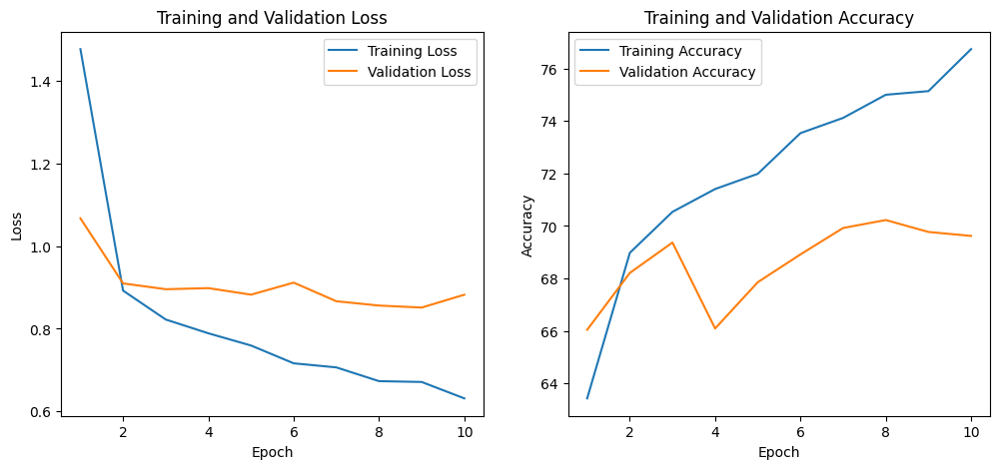

In [28]:
# Plot training and validation loss
plt.figure(figsize=(12, 5))
num_epochs=10

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, num_epochs + 1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()

# CNN

In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split


# Split into train (80%) and validation (20%)
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['cell_type_idx'], random_state=42)

# Reset index after splitting
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

print(f"Training set: {len(train_df)} images")
print(f"Validation set: {len(val_df)} images")

Training set: 7936 images
Validation set: 1985 images


In [30]:
import torchvision.transforms as transforms

transform_train=transforms.Compose([
    transforms.Resize((128,128)),
    transforms.RandomHorizontalFlip(p=0.5),#Flip horizontally with 50% chance
    transforms.RandomRotation(15),  # Randomly rotate up to ±15 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Adjust brightness & contrast
    transforms.ToTensor(),  
    transforms.Normalize(mean=[0.76352966,0.5461343,0.5705373 ], std=[0.11806747,0.1419266,0.15766038])  # Normalize pixel values
])
# Validation data (no augmentation)
transform_val = transforms.Compose([
    transforms.Resize((128, 128)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.76352966,0.5461343,0.5705373 ], std=[0.11806747,0.1419266,0.15766038])  # Normalize pixel values  
])

In [31]:
#create dataset instances
train_dataset=SkinCancerDataset(dataframe=train_df,transform=transform_train)
val_dataset=SkinCancerDataset(dataframe=val_df,transform=transform_val)

In [32]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)


In [33]:
num_classes = len(train_df['cell_type_idx'].unique())
#num_classes = df['cell_type_idx'].nunique()
print(f"Number of classes: {num_classes}")

Number of classes: 7


In [34]:
import torch.nn as nn

In [35]:
class CNNModel(nn.Module):
    def __init__(self, num_classes):
        super(CNNModel, self).__init__()
        
        self.cnn_layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 128x128 → 64x64

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 64x64 → 32x32

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)  # 32x32 → 16x16
        )

        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 16 * 16, 256),
            nn.ReLU(),
            nn.Dropout(0.3),  # Dropout to reduce overfitting
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.cnn_layers(x)
        x = self.fc_layers(x)
        return x

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNModel(num_classes=num_classes).to(device)

In [36]:
import torch.optim as optim
import numpy as np

In [37]:

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()  # Combines LogSoftmax and NLLLoss
optimizer=optim.Adam(model.parameters(),lr=0.001)

In [38]:
def train_cnn(model,train_loader,val_loader,criterion,optimizer,num_epochs,patience):
    train_losses,val_losses=[],[]
    train_accuracies,val_accuracies=[],[]
    
    best_val_accuracy=0
    counter=0
    
    for epoch in range(num_epochs):
        model.train()
        total_loss,correct,total=0,0,0
        
        for images,labels in train_loader:
            images,labels=images.to(device),labels.to(device)
            
            optimizer.zero_grad()
            outputs=model(images)
            loss=criterion(outputs,labels)
            
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            _,predicted=torch.max(outputs,1)
            correct +=(predicted==labels).sum().item()
            total +=labels.size(0)

        avg_train_loss=total_loss/len(train_loader)
        avg_train_acc=correct/total *100
        train_losses.append(avg_train_loss)
        train_accuracies.append(avg_train_acc) 

        #validation
        model.eval()
        val_loss,val_correct,val_total=0,0,0
        with torch.no_grad():
            for images,labels in val_loader:
                images,labels=images.to(device),labels.to(device)
                
                outputs=model(images)
                loss=criterion(outputs,labels)
                
                val_loss+=loss.item()
                _,predicted=torch.max(outputs,1)
                val_correct+=(predicted==labels).sum().item()
                val_total+=labels.size(0)

            avg_val_loss=val_loss/len(val_loader)
            avg_val_acc=val_correct/val_total*100
            val_losses.append(avg_val_loss)
            val_accuracies.append(avg_val_acc)
            
            print(f"Epoch [{epoch+1}/{num_epochs}] → "
              f"Train Loss: {avg_train_loss:.4f}, Train Acc: {avg_train_acc:.2f}% | "
              f"Val Loss: {avg_val_loss:.4f}, Val Acc: {avg_val_acc:.2f}%")
            
            #Early stopping
            if len(val_accuracies) == 0 or avg_val_acc > best_val_accuracy:
                best_val_accuracy=avg_val_acc
                torch.save(model.state_dict(),"best_cnn_model.pth")
                counter=0
            else:
                counter+=1
            if counter >=patience:
                print("Early stopping")
                break

    print("Training Complete!")
    return train_losses, val_losses, train_accuracies, val_accuracies
            

In [39]:
# Train the CNN
train_losses, val_losses,train_accuracies,val_accuracies = train_cnn(model, train_loader, val_loader, criterion, optimizer, num_epochs=20, patience=3)

Epoch [1/20] → Train Loss: 1.3768, Train Acc: 64.78% | Val Loss: 0.9064, Val Acc: 66.30%
Epoch [2/20] → Train Loss: 0.9558, Train Acc: 66.94% | Val Loss: 0.8589, Val Acc: 69.97%
Epoch [3/20] → Train Loss: 0.9064, Train Acc: 68.54% | Val Loss: 0.8426, Val Acc: 69.32%
Epoch [4/20] → Train Loss: 0.8860, Train Acc: 68.71% | Val Loss: 0.8319, Val Acc: 70.63%
Epoch [5/20] → Train Loss: 0.8648, Train Acc: 69.07% | Val Loss: 0.8614, Val Acc: 69.97%
Epoch [6/20] → Train Loss: 0.8678, Train Acc: 68.98% | Val Loss: 0.8375, Val Acc: 70.28%
Epoch [7/20] → Train Loss: 0.8327, Train Acc: 69.78% | Val Loss: 0.8004, Val Acc: 71.34%
Epoch [8/20] → Train Loss: 0.8264, Train Acc: 69.81% | Val Loss: 0.7421, Val Acc: 72.49%
Epoch [9/20] → Train Loss: 0.8074, Train Acc: 70.34% | Val Loss: 0.7340, Val Acc: 73.30%
Epoch [10/20] → Train Loss: 0.7885, Train Acc: 70.25% | Val Loss: 0.7431, Val Acc: 73.00%
Epoch [11/20] → Train Loss: 0.7841, Train Acc: 71.19% | Val Loss: 0.7494, Val Acc: 71.84%
Epoch [12/20] → Tra

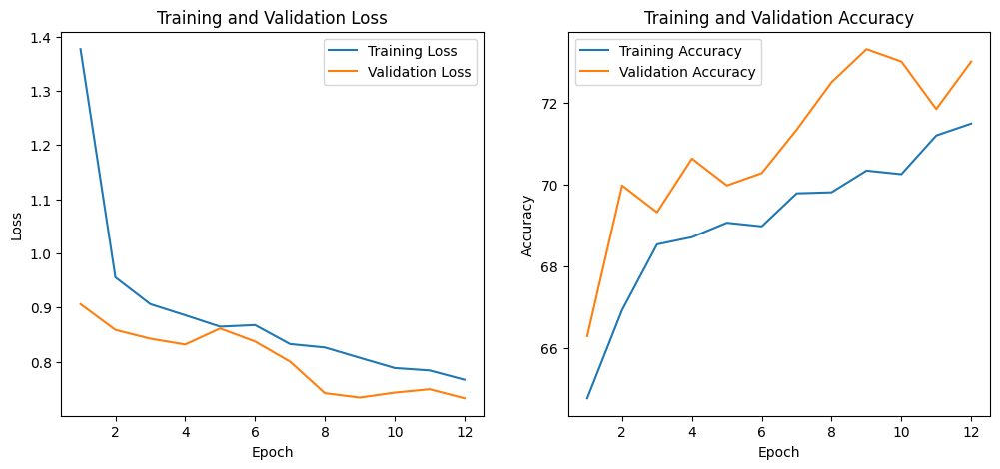

In [41]:
# Plot training and validation loss
plt.figure(figsize=(12, 5))
num_epochs=12

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, num_epochs + 1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()

In [42]:
class_labels = [ 'Melanocytic nevi','Melanoma','Benign keratosis-like lesions ','Basal cell carcinoma', 'Actinic keratoses',
                'Vascular lesions','Dermatofibroma','Melanocytic nevi','Melanoma','Benign keratosis-like lesions ',
                'Basal cell carcinoma','Actinic keratoses','Vascular lesions','Dermatofibroma']

In [43]:
# Validation data (no augmentation)
transform_val = transforms.Compose([
    transforms.Resize((128, 128)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.76352966,0.5461343,0.5705373 ], std=[0.11806747,0.1419266,0.15766038])  # Normalize pixel values  
])

# Create the dataset instance for the full data
#dataset = SkinCancerDataset(df, transform=transform_val)

# ✅ Sample 5 images from df (not dataset)
sample_df = df.sample(n=5, random_state=42).reset_index(drop=True)

# Create a dataset for the sampled images
sample_dataset = SkinCancerDataset(sample_df, transform=transform_val)

# Create DataLoader for batch processing
sample_loader = DataLoader(sample_dataset, batch_size=5, shuffle=False)



In [44]:
# Define the model (make sure this matches the architecture you trained)
model = CNNModel(num_classes)  # Replace with your actual model class

# Load the best saved model weights
model.load_state_dict(torch.load("/kaggle/working/best_cnn_model.pth", map_location=device))

# Move model to the appropriate device
model.to(device)

# Set model to evaluation mode
model.eval()


<ipython-input-44-036bfb1ca5ff>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/kaggle/working/best_cnn_model.pth", map_location=device))

CNNModel(
  (cnn_layers): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fc_layers): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=32768, out_features=256, bias=True)
    (2): ReLU()
    (3): Dropo

In [45]:
# Disable gradient calculation (since we're only making predictions)
with torch.no_grad():
    for images, labels in sample_loader:
        images, labels = images.to(device), labels.to(device)

        # Get model predictions
        outputs = model(images)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        _, predicted = torch.max(outputs, 1)  # Get the class index with highest probability

        # Print results
        for i in range(len(images)):
            confidence = probs[i][predicted[i]].item() * 100
            print(f"True Label: {labels[i].item()}, Predicted: {predicted[i].item()}, confidence : {confidence:.2f}%")


True Label: 4, Predicted: 4, confidence : 99.91%
True Label: 2, Predicted: 2, confidence : 38.81%
True Label: 4, Predicted: 4, confidence : 99.70%
True Label: 4, Predicted: 4, confidence : 83.96%
True Label: 4, Predicted: 4, confidence : 84.49%


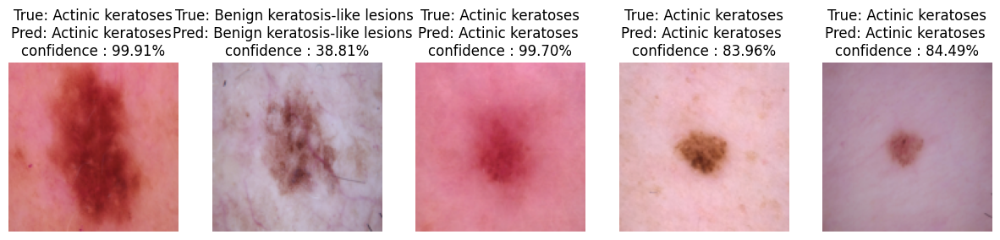

In [46]:

# Disable gradient calculation (since we're only making predictions)
with torch.no_grad():
    for images, labels in sample_loader:
        images, labels = images.to(device), labels.to(device)

        # Get model predictions
        outputs = model(images)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        _, predicted = torch.max(outputs, 1)  # Get the class index with highest probability

        # Move images to CPU and convert to NumPy
        images = images.cpu().numpy().transpose((0, 2, 3, 1))  # Convert from (C, H, W) to (H, W, C)

        # Undo normalization (optional, if you normalized the dataset)
        mean = np.array([0.76352966,0.5461343,0.5705373 ])
        std = np.array([0.11806747,0.1419266,0.15766038])
        images = images * std + mean  # De-normalize
        images = np.clip(images, 0, 1)  # Keep values in [0,1] range

        # Plot images with true and predicted labels
        fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
        for i, ax in enumerate(axes):
            ax.imshow(images[i])
            confidence = probs[i][predicted[i]].item() * 100
            ax.set_title(f"True: {class_labels[labels[i].item()]}\nPred: {class_labels[predicted[i].item()]} \nconfidence : {confidence:.2f}%")
            ax.axis("off")

        plt.show()
        break  # Show only one batch


# CNN with some hyper parameter tuning

In [47]:
import pandas as pd
from sklearn.model_selection import train_test_split


# Split into train (80%) and validation (20%)
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['cell_type_idx'], random_state=42)

# Reset index after splitting
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

print(f"Training set: {len(train_df)} images")
print(f"Validation set: {len(val_df)} images")

Training set: 7936 images
Validation set: 1985 images


In [48]:
import torchvision.transforms as transforms

transform_train=transforms.Compose([
    transforms.Resize((128,128)),
    transforms.RandomHorizontalFlip(p=0.5),#Flip horizontally with 50% chance
    transforms.RandomRotation(15),  # Randomly rotate up to ±15 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Adjust brightness & contrast
    transforms.ToTensor(),  
    transforms.Normalize(mean=[0.76352966,0.5461343,0.5705373 ], std=[0.11806747,0.1419266,0.15766038])  # Normalize pixel values
])
# Validation data (no augmentation)
transform_val = transforms.Compose([
    transforms.Resize((128, 128)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.76352966,0.5461343,0.5705373 ], std=[0.11806747,0.1419266,0.15766038])  # Normalize pixel values  
])

In [49]:
#create dataset instances
train_dataset=SkinCancerDataset(dataframe=train_df,transform=transform_train)
val_dataset=SkinCancerDataset(dataframe=val_df,transform=transform_val)

In [50]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)


In [51]:
num_classes = len(train_df['cell_type_idx'].unique())

In [52]:
import torch
import torch.nn as nn

class CNNModel(nn.Module):
    def __init__(self, num_classes):
        super(CNNModel, self).__init__()

        self.cnn_layers = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 128x128 → 64x64
            
            # Block 2
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 64x64 → 32x32
            
            # Block 3 (Extra conv layer for deeper features)
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(0.2),  # Dropout after conv to reduce overfitting
            nn.MaxPool2d(kernel_size=2, stride=2),  # 32x32 → 16x16
            
            # Block 4
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Dropout(0.3),  
            nn.AdaptiveAvgPool2d((1, 1))  # Converts feature map to 1x1x256
        )

        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 256),  
            nn.ReLU(),
            nn.Dropout(0.4),  # Increased dropout for regularization
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.cnn_layers(x)
        x = self.fc_layers(x)
        return x

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNModel(num_classes=num_classes).to(device)


In [53]:
import torch.optim as optim

from sklearn.utils.class_weight import compute_class_weight

# Compute class weights
class_weights = compute_class_weight(class_weight="balanced", 
                                    classes=np.unique(train_df['cell_type_idx']),
                                    y=train_df['cell_type_idx'])

# Convert to tensor and move to device
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)

# ✅ Use class-weighted loss function
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)  

# Learning Rate Scheduler (Optional but Recommended)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)  # Reduce LR every 5 epochs


In [54]:
import matplotlib.pyplot as plt

num_epochs = 20  # Adjust as needed

# Track metrics
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    model.train()  # Set to training mode
    running_loss, correct_train, total_train = 0.0, 0, 0

    # Training Phase
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        
        _, preds = torch.max(outputs, 1)
        correct_train += (preds == labels).sum().item()
        total_train += labels.size(0)

    train_loss = running_loss / len(train_loader)
    train_acc = correct_train / total_train
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # Validation Phase
    model.eval()  # Set to evaluation mode
    val_loss, correct_val, total_val = 0.0, 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct_val += (preds == labels).sum().item()
            total_val += labels.size(0)

    val_loss = val_loss / len(val_loader)
    val_acc = correct_val / total_val
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    scheduler.step()  # Update learning rate

    print(f"Epoch [{epoch+1}/{num_epochs}] | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")

print("✅ Training Complete!")


Epoch [1/20] | Train Loss: 1.8115 | Val Loss: 1.7010 | Train Acc: 0.4507 | Val Acc: 0.5048
Epoch [2/20] | Train Loss: 1.6763 | Val Loss: 1.5861 | Train Acc: 0.4627 | Val Acc: 0.5224
Epoch [3/20] | Train Loss: 1.5855 | Val Loss: 1.5013 | Train Acc: 0.4848 | Val Acc: 0.5829
Epoch [4/20] | Train Loss: 1.5366 | Val Loss: 1.5241 | Train Acc: 0.4985 | Val Acc: 0.5652
Epoch [5/20] | Train Loss: 1.5057 | Val Loss: 1.4043 | Train Acc: 0.5039 | Val Acc: 0.6307
Epoch [6/20] | Train Loss: 1.4421 | Val Loss: 1.3974 | Train Acc: 0.5223 | Val Acc: 0.6136
Epoch [7/20] | Train Loss: 1.4402 | Val Loss: 1.3737 | Train Acc: 0.5247 | Val Acc: 0.5884
Epoch [8/20] | Train Loss: 1.4184 | Val Loss: 1.3427 | Train Acc: 0.5184 | Val Acc: 0.6257
Epoch [9/20] | Train Loss: 1.4044 | Val Loss: 1.3275 | Train Acc: 0.5377 | Val Acc: 0.6287
Epoch [10/20] | Train Loss: 1.3995 | Val Loss: 1.2946 | Train Acc: 0.5421 | Val Acc: 0.6332
Epoch [11/20] | Train Loss: 1.3748 | Val Loss: 1.2901 | Train Acc: 0.5444 | Val Acc: 0.62

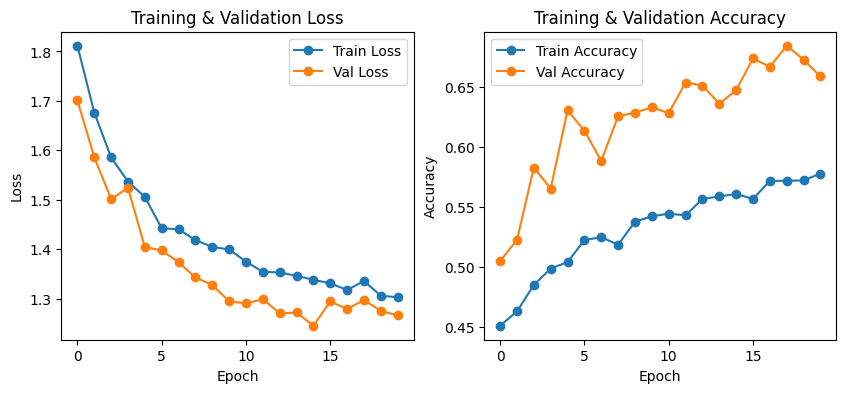

In [55]:
# Plot Loss
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker='o')
plt.plot(val_losses, label="Val Loss", marker='o')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker='o')
plt.plot(val_accuracies, label="Val Accuracy", marker='o')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training & Validation Accuracy")
plt.legend()

plt.show()


In [56]:
torch.save(model.state_dict(), "best_cnn_model.pth")
print("✅ Model weights saved successfully!")


✅ Model weights saved successfully!


In [57]:
class_labels = [ 'Melanocytic nevi','Melanoma','Benign keratosis-like lesions ','Basal cell carcinoma', 'Actinic keratoses',
                'Vascular lesions','Dermatofibroma','Melanocytic nevi','Melanoma','Benign keratosis-like lesions ',
                'Basal cell carcinoma','Actinic keratoses','Vascular lesions','Dermatofibroma']

In [58]:
# Validation data (no augmentation)
transform_val = transforms.Compose([
    transforms.Resize((128, 128)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.76352966,0.5461343,0.5705373 ], std=[0.11806747,0.1419266,0.15766038])  # Normalize pixel values  
])

# Create the dataset instance for the full data
#dataset = SkinCancerDataset(df, transform=transform_val)

# ✅ Sample 5 images from df (not dataset)
sample_df = df.sample(n=5, random_state=42).reset_index(drop=True)

# Create a dataset for the sampled images
sample_dataset = SkinCancerDataset(sample_df, transform=transform_val)

# Create DataLoader for batch processing
sample_loader = DataLoader(sample_dataset, batch_size=5, shuffle=False)


In [59]:
model = CNNModel(num_classes)  # Ensure the architecture is defined
model.load_state_dict(torch.load("best_cnn_model.pth", map_location=device))
model.to(device)
model.eval()  # Set to evaluation mode
print("✅ Model weights loaded successfully!")


✅ Model weights loaded successfully!


<ipython-input-59-aa98f2582983>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_cnn_model.pth", map_location=device))


In [60]:
# Disable gradient calculation (since we're only making predictions)
with torch.no_grad():
    for images, labels in sample_loader:
        images, labels = images.to(device), labels.to(device)

        # Get model predictions
        outputs = model(images)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        _, predicted = torch.max(outputs, 1)  # Get the class index with highest probability

        # Print results
        for i in range(len(images)):
            confidence = probs[i][predicted[i]].item() * 100
            print(f"True Label: {labels[i].item()}, Predicted: {predicted[i].item()}, confidence : {confidence:.2f}%")


True Label: 4, Predicted: 4, confidence : 98.42%
True Label: 2, Predicted: 2, confidence : 30.45%
True Label: 4, Predicted: 4, confidence : 88.99%
True Label: 4, Predicted: 4, confidence : 59.82%
True Label: 4, Predicted: 4, confidence : 39.53%


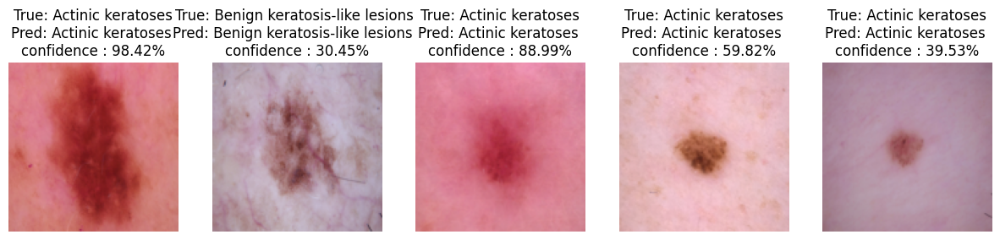

In [61]:
# Disable gradient calculation (since we're only making predictions)
with torch.no_grad():
    for images, labels in sample_loader:
        images, labels = images.to(device), labels.to(device)

        # Get model predictions
        outputs = model(images)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        _, predicted = torch.max(outputs, 1)  # Get the class index with highest probability

        # Move images to CPU and convert to NumPy
        images = images.cpu().numpy().transpose((0, 2, 3, 1))  # Convert from (C, H, W) to (H, W, C)

        # Undo normalization (optional, if you normalized the dataset)
        mean = np.array([0.76352966,0.5461343,0.5705373 ])
        std = np.array([0.11806747,0.1419266,0.15766038])
        images = images * std + mean  # De-normalize
        images = np.clip(images, 0, 1)  # Keep values in [0,1] range

        # Plot images with true and predicted labels
        fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
        for i, ax in enumerate(axes):
            ax.imshow(images[i])
            confidence = probs[i][predicted[i]].item() * 100
            ax.set_title(f"True: {class_labels[labels[i].item()]}\nPred: {class_labels[predicted[i].item()]} \nconfidence : {confidence:.2f}%")
            ax.axis("off")

        plt.show()
        break  # Show only one batch

# XAI


In [22]:
pip install torchcam


     |████████████████████████████████| 3.3 MB 6.4 MB/s eta 0:00:01
  Attempting uninstall: Pillow
    Found existing installation: Pillow 8.2.0
    Uninstalling Pillow-8.2.0:
      Successfully uninstalled Pillow-8.2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.18.3 requires Pillow<=8.2.0, but you have pillow 9.5.0 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [29]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage
from torchcam.methods import SmoothGradCAMpp  # Using SmoothGrad-CAM++
import torchvision.transforms as transforms
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image


In [30]:
# Load the trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = CNNModel(num_classes=num_classes).to(device)  
model.load_state_dict(torch.load("/kaggle/input/cnn-for-skin-disease/pytorch/default/1/best_cnn_model.pth"))
model.eval()  # Set model to evaluation mode


CNNModel(
  (cnn_layers): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fc_layers): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=32768, out_features=256, bias=True)
    (2): ReLU()
    (3): Dropo

In [25]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchcam.methods import SmoothGradCAMpp  # Grad-CAM++
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image


In [24]:
# Select the last convolutional layer for Grad-CAM
cam_extractor = SmoothGradCAMpp(model, target_layer="cnn_layers.6")  # Last Conv Layer

In [46]:
# Select a sample image from validation dataset
image, label = val_dataset[0]  # Get first validation image
input_tensor = image.unsqueeze(0).to(device)  # Add batch dimension

In [48]:
# Forward pass and compute Grad-CAM
output = model(input_tensor)
prediction = torch.argmax(output, dim=1).item()

In [49]:
# Generate heatmap
activation_map = cam_extractor(prediction, output)  # Grad-CAM for predicted class

# Convert to numpy and resize to match image size
heatmap = activation_map[0].cpu().numpy()
heatmap = cv2.resize(heatmap, (128, 128))

In [52]:
# If the heatmap has multiple channels (e.g., 64), reduce to a single channel
if len(heatmap.shape) == 3 and heatmap.shape[-1] > 1:
    heatmap = np.mean(heatmap, axis=-1)  # Take mean across channels


In [53]:
heatmap = np.max(heatmap, axis=-1)  # Take max across channels

In [56]:
heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-10)  # Normalize
heatmap = np.uint8(255 * heatmap)  # Convert to uint8 for OpenCV


In [57]:
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

In [59]:
print("Original Image Shape:", original_image.shape)  
print("Heatmap Shape:", heatmap.shape)

Original Image Shape: (128, 128, 3)
Heatmap Shape: (128, 1, 3)


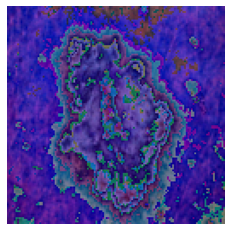

In [60]:
import cv2
import numpy as np
from torchvision.transforms.functional import to_pil_image

# Convert tensor image to NumPy
original_image = np.array(to_pil_image(image))  # Assuming image is a PyTorch tensor

# Ensure heatmap has the correct shape
if heatmap.shape[1] == 1:  # If width is 1, resize it
    heatmap = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))

# Overlay heatmap on original image
overlayed_image = cv2.addWeighted(original_image, 0.5, heatmap, 0.5, 0)

# Display the result
import matplotlib.pyplot as plt
plt.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


# **Transfer Learning**

# RES net

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 174MB/s]


Epoch 1/20, Train Loss: 0.9801, Train Acc: 0.6816, Val Loss: 0.8860, Val Acc: 0.7023
Epoch 2/20, Train Loss: 0.8315, Train Acc: 0.7094, Val Loss: 0.8398, Val Acc: 0.7098
Epoch 3/20, Train Loss: 0.7944, Train Acc: 0.7143, Val Loss: 0.8377, Val Acc: 0.7189
Epoch 4/20, Train Loss: 0.7767, Train Acc: 0.7205, Val Loss: 0.7630, Val Acc: 0.7300
Epoch 5/20, Train Loss: 0.7405, Train Acc: 0.7350, Val Loss: 0.7502, Val Acc: 0.7254
Epoch 6/20, Train Loss: 0.7374, Train Acc: 0.7346, Val Loss: 0.7598, Val Acc: 0.7411
Epoch 7/20, Train Loss: 0.7351, Train Acc: 0.7388, Val Loss: 0.7302, Val Acc: 0.7315
Epoch 8/20, Train Loss: 0.7219, Train Acc: 0.7398, Val Loss: 0.7420, Val Acc: 0.7401
Epoch 9/20, Train Loss: 0.7214, Train Acc: 0.7405, Val Loss: 0.7351, Val Acc: 0.7350
Epoch 10/20, Train Loss: 0.7061, Train Acc: 0.7416, Val Loss: 0.7027, Val Acc: 0.7350
Epoch 11/20, Train Loss: 0.7020, Train Acc: 0.7400, Val Loss: 0.6997, Val Acc: 0.7411
Epoch 12/20, Train Loss: 0.6891, Train Acc: 0.7458, Val Loss: 0

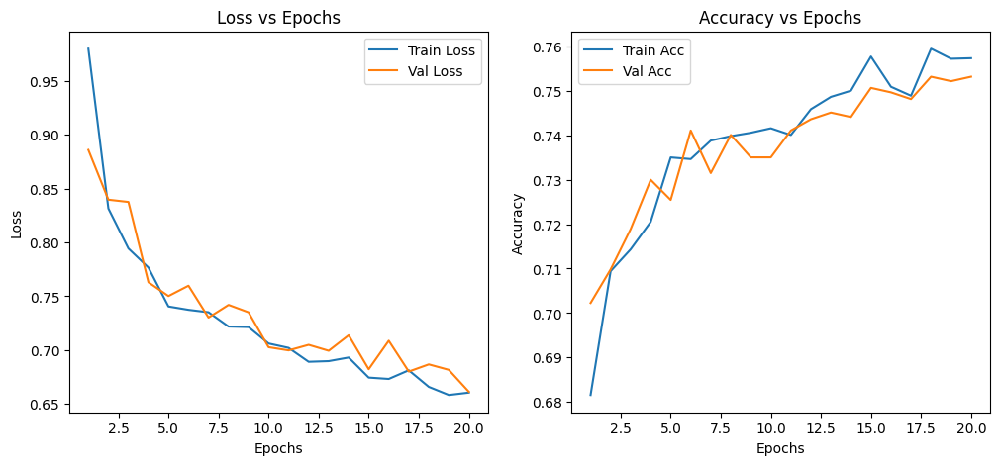

Model saved as resnet_skin_disease.pth


<ipython-input-62-643bf2b06e82>:115: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(filename, map_location=device))


Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.25      0.33        65
           1       0.56      0.46      0.50       103
           2       0.53      0.47      0.50       217
           3       0.33      0.04      0.08        23
           4       0.80      0.95      0.87      1326
           5       0.63      0.26      0.37       223
           6       0.86      0.43      0.57        28

    accuracy                           0.75      1985
   macro avg       0.60      0.41      0.46      1985
weighted avg       0.73      0.75      0.72      1985



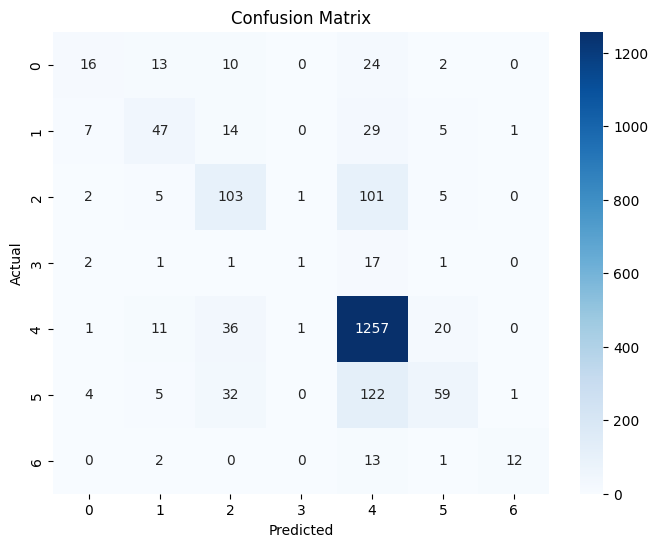

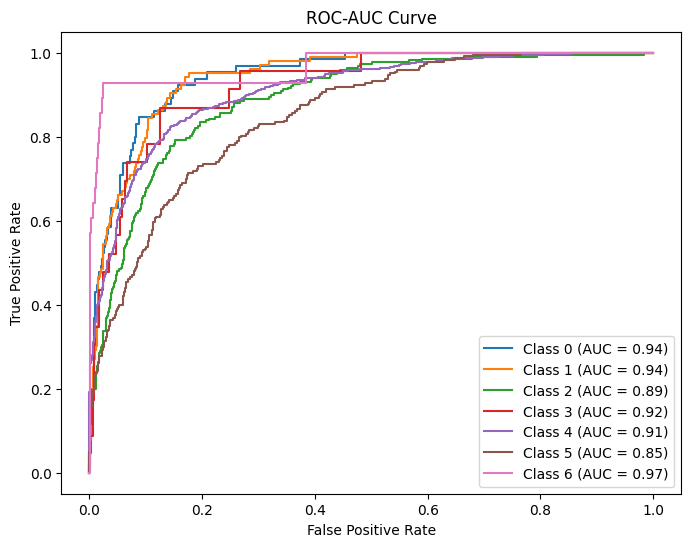

NameError: name 'predict_sample_images' is not defined

In [62]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Define ResNet Model
class ResNetModel(nn.Module):
    def __init__(self, num_classes):
        super(ResNetModel, self).__init__()
        self.model = models.resnet50(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.parameters():
            param.requires_grad = False

        # Modify the classifier
        in_features = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Number of skin disease categories
model = ResNetModel(num_classes=num_classes).to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.model.fc.parameters(), lr=0.0001, weight_decay=1e-4)

# Training Function
def train_model(model, train_loader, val_loader, epochs=20):
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc')
    plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Epochs')
    
    plt.show()

# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return running_loss / len(val_loader), correct / total

# Save and Load Model
def save_model(model, filename="resnet_skin_disease.pth"):
    torch.save(model.state_dict(), filename)
    print(f"Model saved as {filename}")

def load_model(model_class, num_classes, filename="resnet_skin_disease.pth"):
    model = model_class(num_classes=num_classes)
    model.load_state_dict(torch.load(filename, map_location=device))
    model.to(device)
    model.eval()
    return model

# Advanced Evaluation
def advanced_evaluate_model(model, val_loader, num_classes):
    model.to(device)
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    print("Classification Report:")
    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    # ROC-AUC Curve
    all_labels_one_hot = np.eye(num_classes)[all_labels]
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], np.array(all_probs)[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc(fpr, tpr):.2f})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC-AUC Curve")
    plt.legend()
    plt.show()

# Training & Evaluation
train_model(model, train_loader, val_loader, epochs=20)
save_model(model)
model = load_model(ResNetModel, num_classes=7)
advanced_evaluate_model(model, val_loader, num_classes=7)

# Class Labels & Sample Prediction
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]
sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=True)
predict_sample_images(model, sample_loader, class_labels)


# Densenet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 171MB/s]


Epoch 1/20, Train Loss: 1.0430, Train Acc: 0.6689, Val Loss: 0.8802, Val Acc: 0.7053
Epoch 2/20, Train Loss: 0.8658, Train Acc: 0.6982, Val Loss: 0.8312, Val Acc: 0.7209
Epoch 3/20, Train Loss: 0.8094, Train Acc: 0.7177, Val Loss: 0.7784, Val Acc: 0.7290
Epoch 4/20, Train Loss: 0.7843, Train Acc: 0.7201, Val Loss: 0.7646, Val Acc: 0.7154
Epoch 5/20, Train Loss: 0.7596, Train Acc: 0.7278, Val Loss: 0.7447, Val Acc: 0.7259
Epoch 6/20, Train Loss: 0.7477, Train Acc: 0.7344, Val Loss: 0.7300, Val Acc: 0.7335
Epoch 7/20, Train Loss: 0.7375, Train Acc: 0.7346, Val Loss: 0.7396, Val Acc: 0.7315
Epoch 8/20, Train Loss: 0.7204, Train Acc: 0.7383, Val Loss: 0.7171, Val Acc: 0.7365
Epoch 9/20, Train Loss: 0.7083, Train Acc: 0.7431, Val Loss: 0.7270, Val Acc: 0.7360
Epoch 10/20, Train Loss: 0.6971, Train Acc: 0.7472, Val Loss: 0.7105, Val Acc: 0.7350
Epoch 11/20, Train Loss: 0.7072, Train Acc: 0.7460, Val Loss: 0.7325, Val Acc: 0.7345
Epoch 12/20, Train Loss: 0.6920, Train Acc: 0.7500, Val Loss: 0

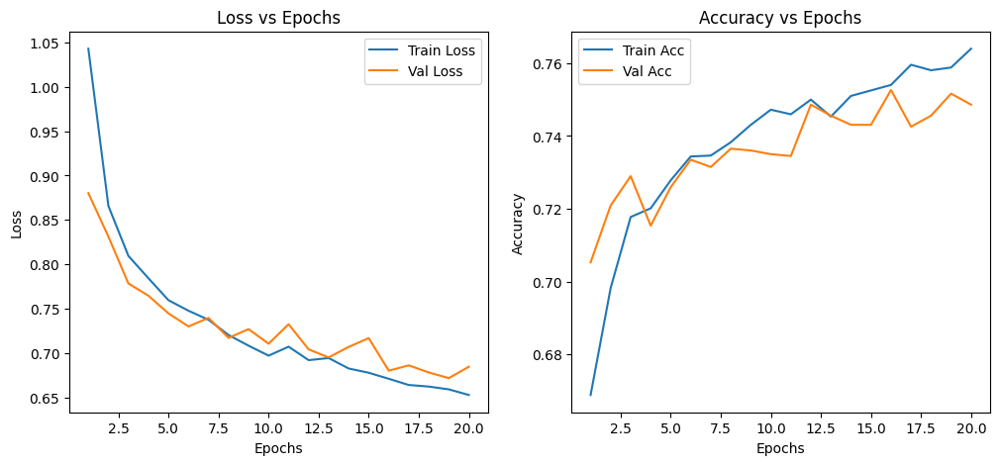

Model saved as densenet_skin_disease.pth


<ipython-input-63-c606552f69a8>:115: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(filename, map_location=device))


Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.20      0.29        65
           1       0.45      0.45      0.45       103
           2       0.48      0.53      0.50       217
           3       0.67      0.09      0.15        23
           4       0.85      0.93      0.89      1326
           5       0.47      0.30      0.37       223
           6       0.79      0.39      0.52        28

    accuracy                           0.75      1985
   macro avg       0.60      0.41      0.45      1985
weighted avg       0.73      0.75      0.73      1985



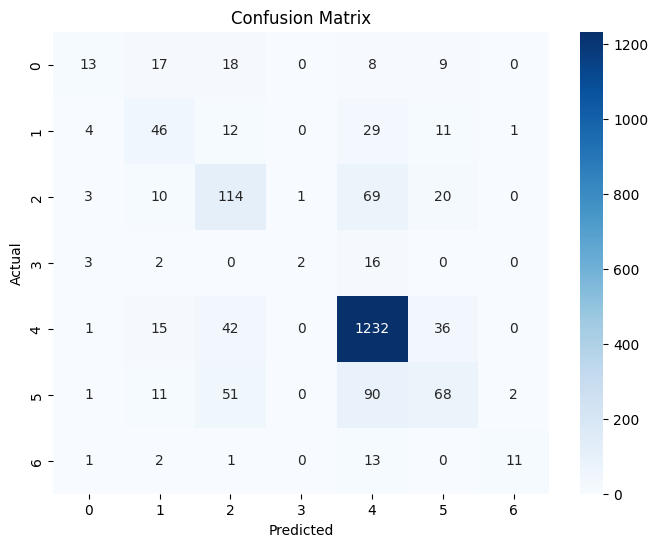

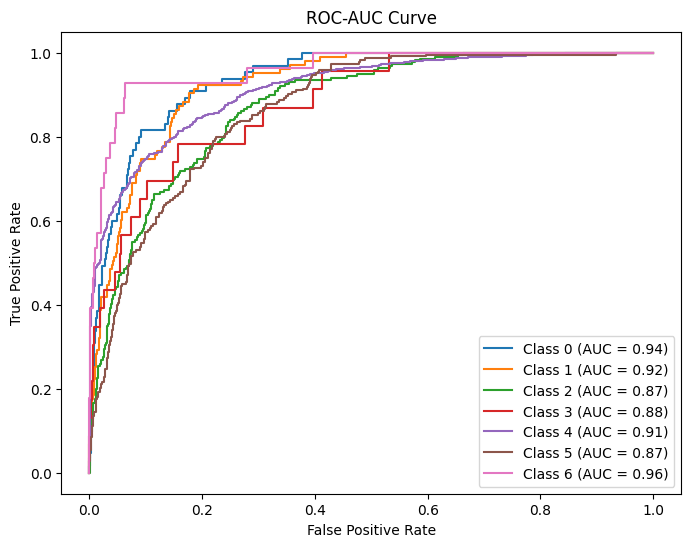

NameError: name 'predict_sample_images' is not defined

In [63]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Define DenseNet Model
class DenseNetModel(nn.Module):
    def __init__(self, num_classes):
        super(DenseNetModel, self).__init__()
        self.model = models.densenet121(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Modify the classifier
        in_features = self.model.classifier.in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Number of skin disease categories
model = DenseNetModel(num_classes=num_classes).to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.model.classifier.parameters(), lr=0.0001, weight_decay=1e-4)

# Training Function
def train_model(model, train_loader, val_loader, epochs=20):
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc')
    plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Epochs')
    
    plt.show()

# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return running_loss / len(val_loader), correct / total

# Save and Load Model
def save_model(model, filename="densenet_skin_disease.pth"):
    torch.save(model.state_dict(), filename)
    print(f"Model saved as {filename}")

def load_model(model_class, num_classes, filename="densenet_skin_disease.pth"):
    model = model_class(num_classes=num_classes)
    model.load_state_dict(torch.load(filename, map_location=device))
    model.to(device)
    model.eval()
    return model

# Advanced Evaluation
def advanced_evaluate_model(model, val_loader, num_classes):
    model.to(device)
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    print("Classification Report:")
    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    # ROC-AUC Curve
    all_labels_one_hot = np.eye(num_classes)[all_labels]
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], np.array(all_probs)[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc(fpr, tpr):.2f})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC-AUC Curve")
    plt.legend()
    plt.show()

# Training & Evaluation
train_model(model, train_loader, val_loader, epochs=20)
save_model(model)
model = load_model(DenseNetModel, num_classes=7)
advanced_evaluate_model(model, val_loader, num_classes=7)

# Class Labels & Sample Prediction
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]
sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=True)
predict_sample_images(model, sample_loader, class_labels)


# Mobilenet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 141MB/s]


Epoch 1/20, Train Loss: 0.9819, Train Acc: 0.6787, Val Loss: 0.7902, Val Acc: 0.7295
Epoch 2/20, Train Loss: 0.7835, Train Acc: 0.7251, Val Loss: 0.7181, Val Acc: 0.7562
Epoch 3/20, Train Loss: 0.7170, Train Acc: 0.7426, Val Loss: 0.6778, Val Acc: 0.7693
Epoch 4/20, Train Loss: 0.6772, Train Acc: 0.7587, Val Loss: 0.6942, Val Acc: 0.7688
Epoch 5/20, Train Loss: 0.6715, Train Acc: 0.7588, Val Loss: 0.6494, Val Acc: 0.7788
Epoch 6/20, Train Loss: 0.6411, Train Acc: 0.7728, Val Loss: 0.6426, Val Acc: 0.7829
Epoch 7/20, Train Loss: 0.6281, Train Acc: 0.7710, Val Loss: 0.6331, Val Acc: 0.7844
Epoch 8/20, Train Loss: 0.6062, Train Acc: 0.7786, Val Loss: 0.6269, Val Acc: 0.7798
Epoch 9/20, Train Loss: 0.6076, Train Acc: 0.7797, Val Loss: 0.6171, Val Acc: 0.7884
Epoch 10/20, Train Loss: 0.5826, Train Acc: 0.7868, Val Loss: 0.6205, Val Acc: 0.7854
Epoch 11/20, Train Loss: 0.5709, Train Acc: 0.7921, Val Loss: 0.6155, Val Acc: 0.7864
Epoch 12/20, Train Loss: 0.5602, Train Acc: 0.7964, Val Loss: 0

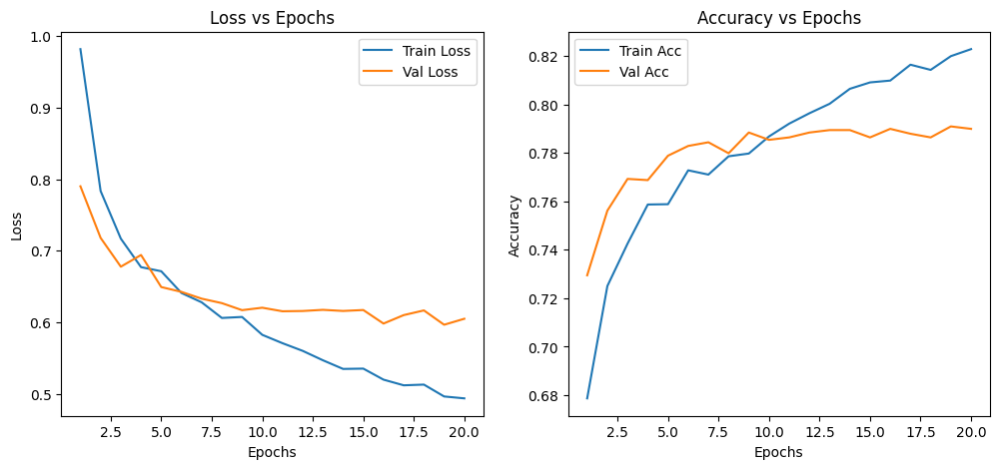

Model saved as mobilenet_skin_disease.pth


<ipython-input-22-348c42dd6862>:118: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(filename, map_location=device))


Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.54      0.51        59
           1       0.65      0.42      0.51        89
           2       0.61      0.58      0.59       221
           3       0.47      0.44      0.45        16
           4       0.85      0.95      0.90      1343
           5       0.61      0.34      0.44       228
           6       0.74      0.48      0.58        29

    accuracy                           0.79      1985
   macro avg       0.63      0.54      0.57      1985
weighted avg       0.77      0.79      0.77      1985



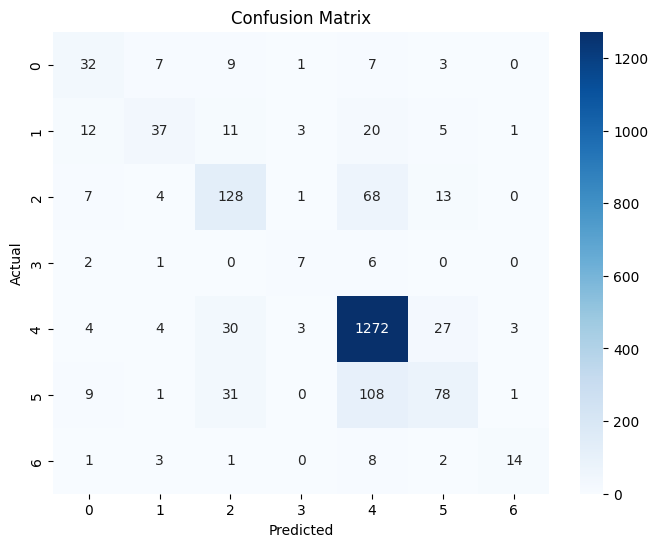

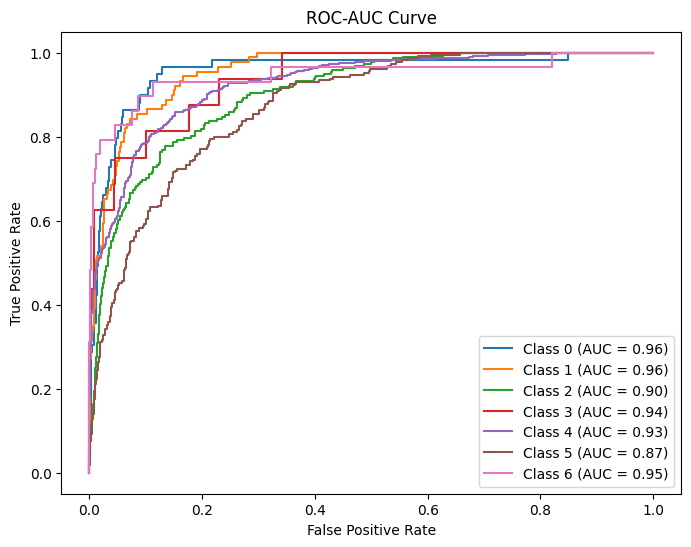

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Define MobileNetV2 Model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Modify the classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Number of skin disease categories
model = MobileNetV2Model(num_classes=num_classes).to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.model.classifier.parameters(), lr=0.0001, weight_decay=1e-4)

# Training Function
def train_model(model, train_loader, val_loader, epochs=20):
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc')
    plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Epochs')
    
    plt.show()

# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return running_loss / len(val_loader), correct / total

# Save and Load Model
def save_model(model, filename="mobilenet_skin_disease.pth"):
    torch.save(model.state_dict(), filename)
    print(f"Model saved as {filename}")

def load_model(model_class, num_classes, filename="mobilenet_skin_disease.pth"):
    model = model_class(num_classes=num_classes)
    model.load_state_dict(torch.load(filename, map_location=device))
    model.to(device)
    model.eval()
    return model

# Advanced Evaluation
def advanced_evaluate_model(model, val_loader, num_classes):
    model.to(device)
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    print("Classification Report:")
    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    # ROC-AUC Curve
    all_labels_one_hot = np.eye(num_classes)[all_labels]
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], np.array(all_probs)[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc(fpr, tpr):.2f})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC-AUC Curve")
    plt.legend()
    plt.show()

# Prediction Visualization Function
def predict_sample_images(model, sample_loader, class_labels):
    model.eval()
    images, labels = next(iter(sample_loader))
    images, labels = images.to(device), labels.to(device)

    with torch.no_grad():
        outputs = model(images)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        _, preds = torch.max(probs, 1)

    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for i in range(len(images)):
        image = images[i].cpu().permute(1, 2, 0).numpy()
        image = (image - image.min()) / (image.max() - image.min())  # Normalize for visualization
        axes[i].imshow(image)
        axes[i].axis("off")
        axes[i].set_title(f"Pred: {class_labels[preds[i]]}\nTrue: {class_labels[labels[i]]}", 
                          color=("green" if preds[i] == labels[i] else "red"))

    plt.show()

# Training & Evaluation
train_model(model, train_loader, val_loader, epochs=20)
save_model(model)
model = load_model(MobileNetV2Model, num_classes=7)
advanced_evaluate_model(model, val_loader, num_classes=7)

# Class Labels & Sample Prediction
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]
sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=True)

# Call the function to visualize predictions
predict_sample_images(model, sample_loader, class_labels)


In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Define MobileNetV2 Model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Modify the classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Number of skin disease categories
model = MobileNetV2Model(num_classes=num_classes).to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.model.classifier.parameters(), lr=0.0001, weight_decay=1e-4)

# Training Function
def train_model(model, train_loader, val_loader, epochs=20):
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc')
    plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Epochs')
    
    plt.show()

# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return running_loss / len(val_loader), correct / total

# Save and Load Model
def save_model(model, filename="mobilenet_skin_disease.pth"):
    torch.save(model.state_dict(), filename)
    print(f"Model saved as {filename}")

def load_model(model_class, num_classes, filename="mobilenet_skin_disease.pth"):
    model = model_class(num_classes=num_classes)
    model.load_state_dict(torch.load(filename, map_location=device))
    model.to(device)
    model.eval()
    return model

# Advanced Evaluation
def advanced_evaluate_model(model, val_loader, num_classes):
    model.to(device)
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    print("Classification Report:")
    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    # ROC-AUC Curve
    all_labels_one_hot = np.eye(num_classes)[all_labels]
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], np.array(all_probs)[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc(fpr, tpr):.2f})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC-AUC Curve")
    plt.legend()
    plt.show()

# Training & Evaluation
train_model(model, train_loader, val_loader, epochs=20)
save_model(model)
model = load_model(MobileNetV2Model, num_classes=7)
advanced_evaluate_model(model, val_loader, num_classes=7)

# Class Labels & Sample Prediction
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]
sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=True)
predict_sample_images(model, sample_loader, class_labels)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 75.5MB/s]


NameError: name 'train_loader' is not defined

# EfficientNet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 123MB/s] 


Epoch 1/20, Train Loss: 1.1304, Train Acc: 0.6680, Val Loss: 0.9486, Val Acc: 0.7169
Epoch 2/20, Train Loss: 0.8956, Train Acc: 0.7010, Val Loss: 0.8500, Val Acc: 0.7370
Epoch 3/20, Train Loss: 0.8243, Train Acc: 0.7164, Val Loss: 0.7905, Val Acc: 0.7431
Epoch 4/20, Train Loss: 0.7866, Train Acc: 0.7327, Val Loss: 0.7687, Val Acc: 0.7436
Epoch 5/20, Train Loss: 0.7589, Train Acc: 0.7354, Val Loss: 0.7473, Val Acc: 0.7526
Epoch 6/20, Train Loss: 0.7316, Train Acc: 0.7471, Val Loss: 0.7295, Val Acc: 0.7537
Epoch 7/20, Train Loss: 0.6986, Train Acc: 0.7542, Val Loss: 0.7165, Val Acc: 0.7552
Epoch 8/20, Train Loss: 0.6869, Train Acc: 0.7607, Val Loss: 0.7197, Val Acc: 0.7506
Epoch 9/20, Train Loss: 0.6745, Train Acc: 0.7611, Val Loss: 0.7065, Val Acc: 0.7496
Epoch 10/20, Train Loss: 0.6620, Train Acc: 0.7681, Val Loss: 0.7055, Val Acc: 0.7537
Epoch 11/20, Train Loss: 0.6602, Train Acc: 0.7637, Val Loss: 0.6880, Val Acc: 0.7501
Epoch 12/20, Train Loss: 0.6362, Train Acc: 0.7704, Val Loss: 0

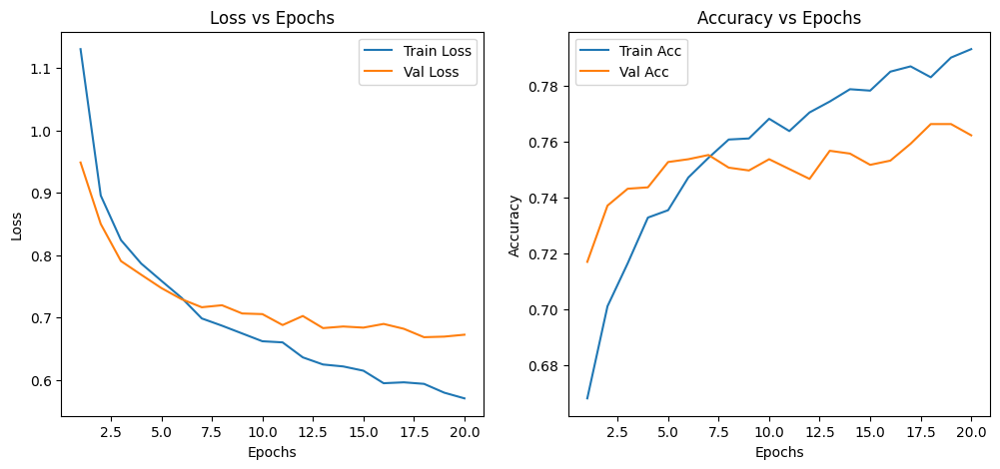

Model saved as efficientnet_skin_disease.pth


<ipython-input-25-d8ccbd7225e5>:115: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(filename, map_location=device))


Classification Report:
              precision    recall  f1-score   support

           0       0.46      0.44      0.45        55
           1       0.40      0.34      0.36        95
           2       0.62      0.48      0.54       214
           3       0.67      0.18      0.29        22
           4       0.84      0.93      0.88      1352
           5       0.51      0.37      0.43       220
           6       0.50      0.26      0.34        27

    accuracy                           0.76      1985
   macro avg       0.57      0.43      0.47      1985
weighted avg       0.74      0.76      0.74      1985



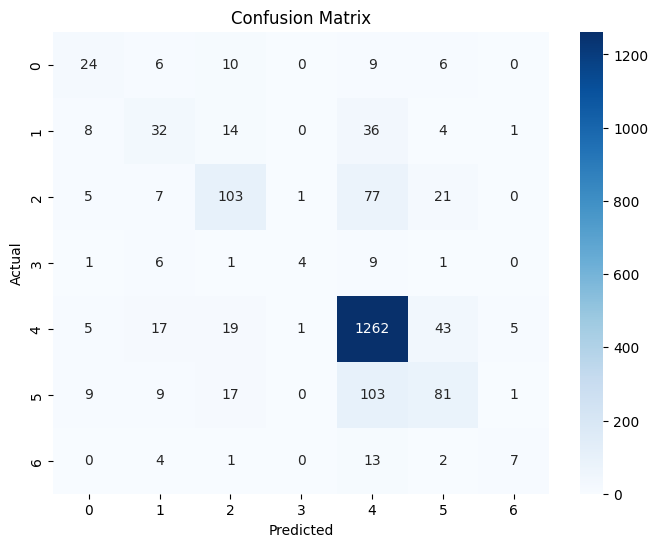

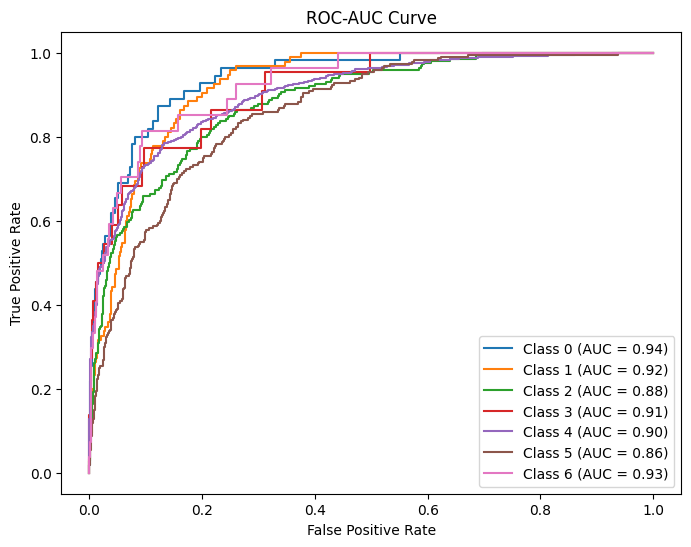

NameError: name 'predict_sample_images' is not defined

In [25]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Define EfficientNet Model
class EfficientNetModel(nn.Module):
    def __init__(self, num_classes):
        super(EfficientNetModel, self).__init__()
        self.model = models.efficientnet_b0(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Modify the classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Number of skin disease categories
model = EfficientNetModel(num_classes=num_classes).to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.model.classifier.parameters(), lr=0.0001, weight_decay=1e-4)

# Training Function
def train_model(model, train_loader, val_loader, epochs=20):
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc')
    plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Epochs')
    
    plt.show()

# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return running_loss / len(val_loader), correct / total

# Save and Load Model
def save_model(model, filename="efficientnet_skin_disease.pth"):
    torch.save(model.state_dict(), filename)
    print(f"Model saved as {filename}")

def load_model(model_class, num_classes, filename="efficientnet_skin_disease.pth"):
    model = model_class(num_classes=num_classes)
    model.load_state_dict(torch.load(filename, map_location=device))
    model.to(device)
    model.eval()
    return model

# Advanced Evaluation
def advanced_evaluate_model(model, val_loader, num_classes):
    model.to(device)
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    print("Classification Report:")
    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    # ROC-AUC Curve
    all_labels_one_hot = np.eye(num_classes)[all_labels]
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], np.array(all_probs)[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc(fpr, tpr):.2f})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC-AUC Curve")
    plt.legend()
    plt.show()

# Training & Evaluation
train_model(model, train_loader, val_loader, epochs=20)
save_model(model)
model = load_model(EfficientNetModel, num_classes=7)
advanced_evaluate_model(model, val_loader, num_classes=7)

# Class Labels & Sample Prediction
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]
sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=True)
predict_sample_images(model, sample_loader, class_labels)

# **VGG (Visual Geometry Group)**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 206MB/s]  


Epoch 1/20, Train Loss: 0.9462, Train Acc: 0.6872, Val Loss: 0.7895, Val Acc: 0.7375
Epoch 2/20, Train Loss: 0.7971, Train Acc: 0.7142, Val Loss: 0.7311, Val Acc: 0.7461
Epoch 3/20, Train Loss: 0.7546, Train Acc: 0.7259, Val Loss: 0.7174, Val Acc: 0.7496
Epoch 4/20, Train Loss: 0.7305, Train Acc: 0.7355, Val Loss: 0.7065, Val Acc: 0.7572
Epoch 5/20, Train Loss: 0.7117, Train Acc: 0.7412, Val Loss: 0.7027, Val Acc: 0.7602
Epoch 6/20, Train Loss: 0.6949, Train Acc: 0.7501, Val Loss: 0.6947, Val Acc: 0.7678
Epoch 7/20, Train Loss: 0.6778, Train Acc: 0.7560, Val Loss: 0.6849, Val Acc: 0.7728
Epoch 8/20, Train Loss: 0.6723, Train Acc: 0.7537, Val Loss: 0.6741, Val Acc: 0.7678
Epoch 9/20, Train Loss: 0.6485, Train Acc: 0.7607, Val Loss: 0.6708, Val Acc: 0.7728
Epoch 10/20, Train Loss: 0.6489, Train Acc: 0.7635, Val Loss: 0.6667, Val Acc: 0.7738
Epoch 11/20, Train Loss: 0.6320, Train Acc: 0.7685, Val Loss: 0.6667, Val Acc: 0.7703
Epoch 12/20, Train Loss: 0.6311, Train Acc: 0.7688, Val Loss: 0

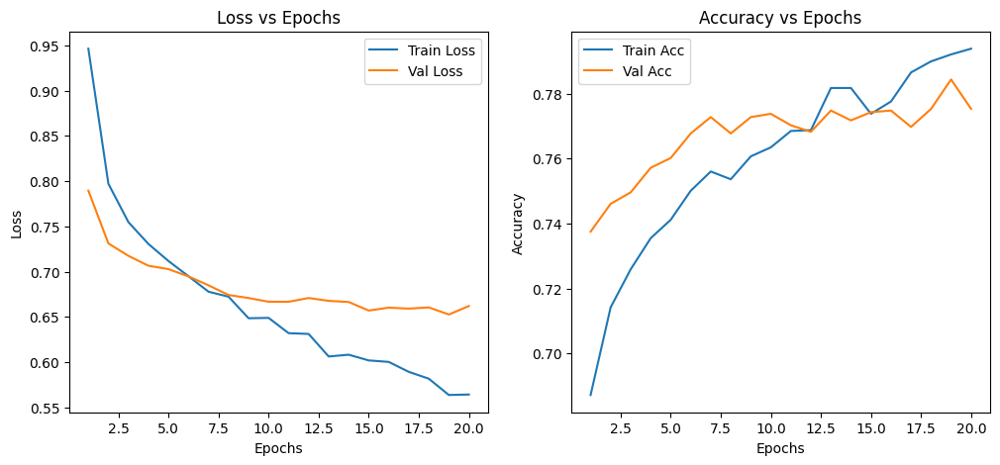

Model saved as vgg_skin_disease.pth


<ipython-input-26-41c38baca83a>:115: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(filename, map_location=device))


Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.42      0.46        55
           1       0.52      0.53      0.52        95
           2       0.65      0.37      0.47       214
           3       0.64      0.32      0.42        22
           4       0.83      0.96      0.89      1352
           5       0.54      0.31      0.40       220
           6       0.68      0.48      0.57        27

    accuracy                           0.78      1985
   macro avg       0.62      0.48      0.53      1985
weighted avg       0.75      0.78      0.75      1985



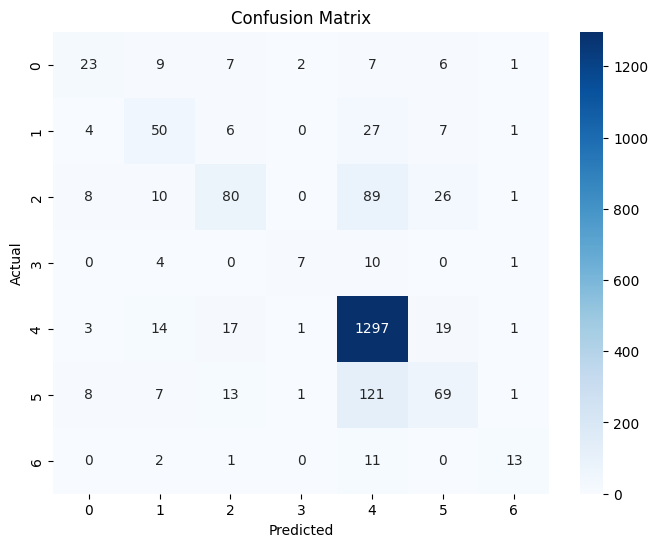

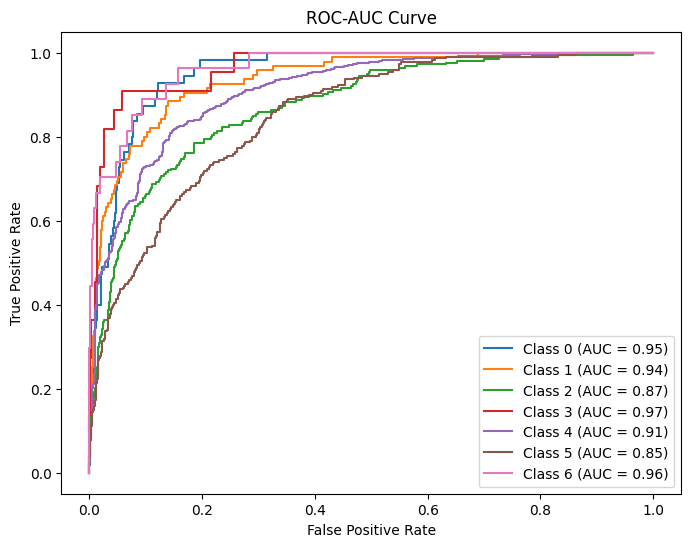

NameError: name 'predict_sample_images' is not defined

In [26]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Define VGG Model
class VGGModel(nn.Module):
    def __init__(self, num_classes):
        super(VGGModel, self).__init__()
        self.model = models.vgg16(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Modify the classifier
        in_features = self.model.classifier[6].in_features
        self.model.classifier[6] = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Number of skin disease categories
model = VGGModel(num_classes=num_classes).to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.model.classifier[6].parameters(), lr=0.0001, weight_decay=1e-4)

# Training Function
def train_model(model, train_loader, val_loader, epochs=20):
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc')
    plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Epochs')
    
    plt.show()

# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return running_loss / len(val_loader), correct / total

# Save and Load Model
def save_model(model, filename="vgg_skin_disease.pth"):
    torch.save(model.state_dict(), filename)
    print(f"Model saved as {filename}")

def load_model(model_class, num_classes, filename="vgg_skin_disease.pth"):
    model = model_class(num_classes=num_classes)
    model.load_state_dict(torch.load(filename, map_location=device))
    model.to(device)
    model.eval()
    return model

# Advanced Evaluation
def advanced_evaluate_model(model, val_loader, num_classes):
    model.to(device)
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    print("Classification Report:")
    print(classification_report(all_labels, all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    # ROC-AUC Curve
    all_labels_one_hot = np.eye(num_classes)[all_labels]
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], np.array(all_probs)[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc(fpr, tpr):.2f})")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC-AUC Curve")
    plt.legend()
    plt.show()

# Training & Evaluation
train_model(model, train_loader, val_loader, epochs=20)
save_model(model)
model = load_model(VGGModel, num_classes=7)
advanced_evaluate_model(model, val_loader, num_classes=7)

# Class Labels & Sample Prediction
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]
sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=True)
predict_sample_images(model, sample_loader, class_labels)


# ConvNeXt

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Base_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Base_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/convnext_base-6075fbad.pth" to /root/.cache/torch/hub/checkpoints/convnext_base-6075fbad.pth
100%|██████████| 338M/338M [00:02<00:00, 123MB/s]  


Epoch 1/20, Train Loss: 1.0547, Train Acc: 0.6685, Val Loss: 0.8924, Val Acc: 0.7088
Epoch 2/20, Train Loss: 0.8660, Train Acc: 0.6991, Val Loss: 0.7944, Val Acc: 0.7285
Epoch 3/20, Train Loss: 0.8031, Train Acc: 0.7113, Val Loss: 0.7424, Val Acc: 0.7370
Epoch 4/20, Train Loss: 0.7656, Train Acc: 0.7230, Val Loss: 0.7175, Val Acc: 0.7476
Epoch 5/20, Train Loss: 0.7422, Train Acc: 0.7321, Val Loss: 0.6921, Val Acc: 0.7537
Epoch 6/20, Train Loss: 0.7195, Train Acc: 0.7365, Val Loss: 0.6690, Val Acc: 0.7592
Epoch 7/20, Train Loss: 0.6979, Train Acc: 0.7480, Val Loss: 0.6688, Val Acc: 0.7602
Epoch 8/20, Train Loss: 0.6843, Train Acc: 0.7503, Val Loss: 0.6446, Val Acc: 0.7678
Epoch 9/20, Train Loss: 0.6692, Train Acc: 0.7563, Val Loss: 0.6381, Val Acc: 0.7683
Epoch 10/20, Train Loss: 0.6590, Train Acc: 0.7579, Val Loss: 0.6269, Val Acc: 0.7708
Epoch 11/20, Train Loss: 0.6471, Train Acc: 0.7674, Val Loss: 0.6255, Val Acc: 0.7758
Epoch 12/20, Train Loss: 0.6377, Train Acc: 0.7656, Val Loss: 0

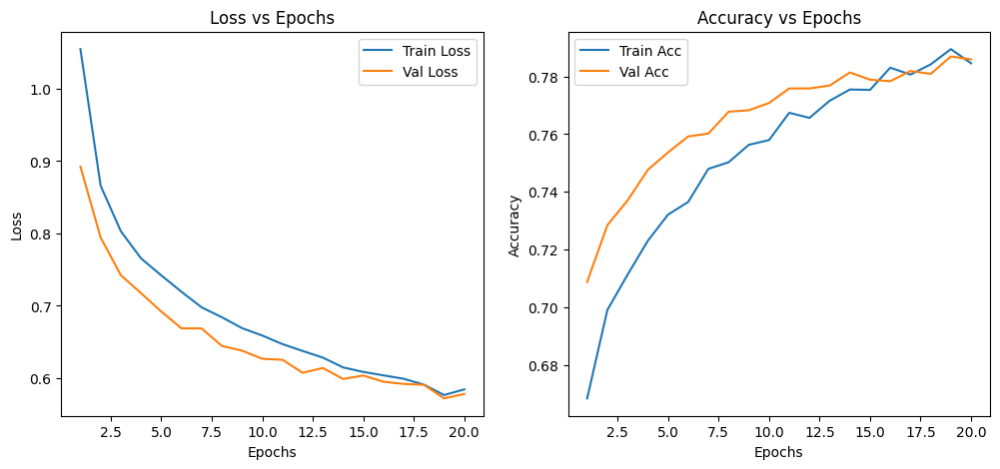

Model saved as convnext_skin_disease.pth


<ipython-input-27-63dee9fdfb3d>:119: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(filename, map_location=torch.device("cuda" if torch.cuda.

Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.36      0.44        55
           1       0.53      0.53      0.53        95
           2       0.68      0.43      0.53       214
           3       0.60      0.27      0.37        22
           4       0.84      0.97      0.90      1352
           5       0.54      0.33      0.41       220
           6       0.85      0.41      0.55        27

    accuracy                           0.79      1985
   macro avg       0.66      0.47      0.53      1985
weighted avg       0.76      0.79      0.76      1985



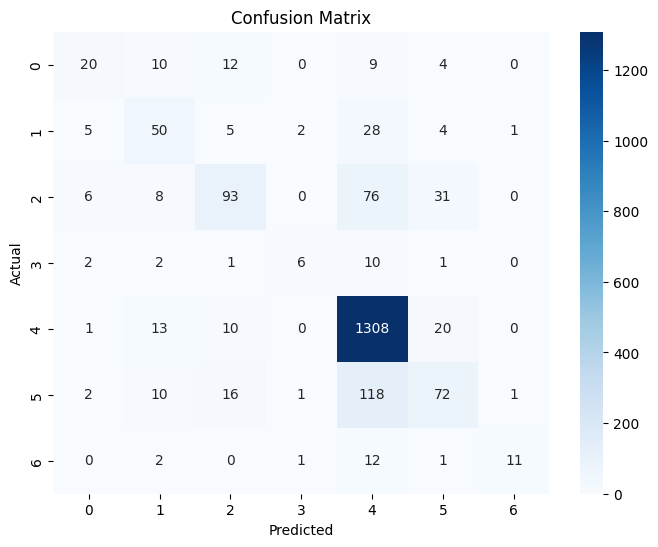

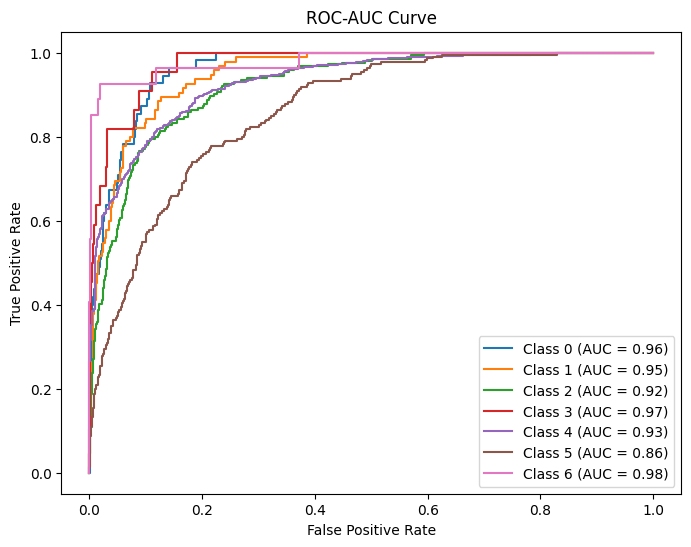

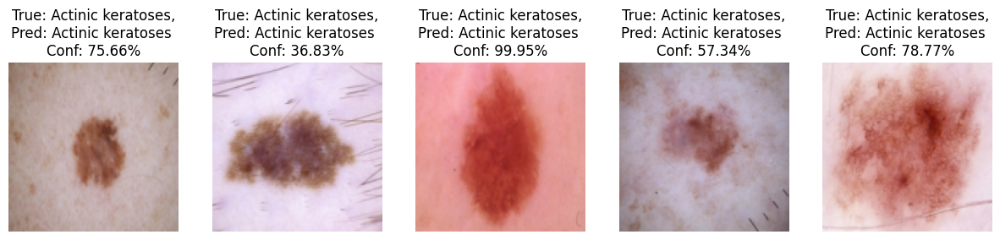

In [27]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Define ConvNeXt Model
class ConvNeXtModel(nn.Module):
    def __init__(self, num_classes):
        super(ConvNeXtModel, self).__init__()
        self.model = models.convnext_base(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Modify the classifier
        in_features = self.model.classifier[2].in_features
        self.model.classifier[2] = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Number of skin disease categories
model = ConvNeXtModel(num_classes=num_classes).to(device)

# Loss Function & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.model.classifier[2].parameters(), lr=0.0001, weight_decay=1e-4)


# Training Function
def train_model(model, train_loader, val_loader, epochs=20):
    train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
    
    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_loss, val_acc = evaluate_model(model, val_loader)
        
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    # Plot training history
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc')
    plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy vs Epochs')
    
    plt.show()


# Evaluation Function
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return running_loss / len(val_loader), correct / total


# Save the trained model
def save_model(model, filename="convnext_skin_disease.pth"):
    torch.save(model.state_dict(), filename)
    print(f"Model saved as {filename}")

# Load the model for evaluation
def load_model(model_class, num_classes, filename="convnext_skin_disease.pth"):
    model = model_class(num_classes=num_classes)
    model.load_state_dict(torch.load(filename, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")))
    model.to(device)
    model.eval()
    return model

# Advanced Evaluation with Classification Report, Confusion Matrix, and ROC-AUC Curve
def advanced_evaluate_model(model, val_loader, num_classes):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    
    all_preds, all_labels, all_probs = [], [], []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    
    # Classification Report
    print("Classification Report:")
    print(classification_report(all_labels, all_preds))
    
    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    # ROC-AUC Curve
    all_labels_one_hot = np.eye(num_classes)[all_labels]  # Convert labels to one-hot encoding
    plt.figure(figsize=(8, 6))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(all_labels_one_hot[:, i], np.array(all_probs)[:, i])
        plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc(fpr, tpr):.2f})")
    
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC-AUC Curve")
    plt.legend()
    plt.show()


# Function to Predict Sample Images
def predict_sample_images(model, sample_loader, class_labels):
    model.eval()
    with torch.no_grad():
        for images, labels in sample_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            
            images = images.cpu().numpy().transpose((0, 2, 3, 1))  # Convert to (H, W, C)
            mean = np.array([0.76352966, 0.5461343, 0.5705373])
            std = np.array([0.11806747, 0.1419266, 0.15766038])
            images = images * std + mean  # De-normalize
            images = np.clip(images, 0, 1)
            
            fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
            for i, ax in enumerate(axes):
                ax.imshow(images[i])
                confidence = probs[i][predicted[i]].item() * 100
                ax.set_title(f"True: {class_labels[labels[i].item()]},\nPred: {class_labels[predicted[i].item()]} \nConf: {confidence:.2f}%")
                ax.axis("off")
            plt.show()
            break  # Show only one batch


# Train and Evaluate ConvNeXt Model
train_model(model, train_loader, val_loader, epochs=20)

# Save & Load Model for Evaluation
save_model(model)
model = load_model(ConvNeXtModel, num_classes=7)

# Run Advanced Evaluation
advanced_evaluate_model(model, val_loader, num_classes=7)

# Define class labels (modify according to your dataset)
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]

# Ensure sample_loader is defined 
sample_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=True)

# Predict Sample Images
predict_sample_images(model, sample_loader, class_labels)

## **Exploratory Data Analysis**

Exploratory data analysis can help detect obvious errors, identify outliers in datasets, understand relationships, unearth important factors, find patterns within data, and provide new insights.

In [ ]:
df= df[df['age'] != 0]
df= df[df['sex'] != 'unknown']

### UNIVARIATE ANALYSIS

In [ ]:
plt.figure(figsize=(20,10))
plt.subplots_adjust(left=0.125, bottom=1, right=0.9, top=2, hspace=0.2)
plt.subplot(2,4,1)
plt.title("AGE",fontsize=15)
plt.ylabel("Count")
df['age'].value_counts().plot.bar()

plt.subplot(2,4,2)
plt.title("GENDER",fontsize=15)
plt.ylabel("Count")
df['sex'].value_counts().plot.bar()

plt.subplot(2,4,3)
plt.title("localization",fontsize=15)
plt.ylabel("Count")
plt.xticks(rotation=45)
df['localization'].value_counts().plot.bar()

plt.subplot(2,4,4)
plt.title("CELL TYPE",fontsize=15)
plt.ylabel("Count")
df['cell_type'].value_counts().plot.bar()

1. Skin diseases are found to be maximum in people aged around 45. Minimum for 10 and below. We also observe that the probability of having skin disease increases with the increase in age.
2. Skin diseases are more prominent in Men as compared to Women and other gender.
3. Skin diseases are more visible on the "back" of the body and least on the "acral surfaces"(such as limbs, fingers, or ears).
4. The most found disease among people is Melanocytic nevi while the least found is Dermatofibroma.

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
df['dx'].value_counts().plot.pie(autopct="%1.1f%%")
plt.subplot(1,2,2)
df['dx_type'].value_counts().plot.pie(autopct="%1.1f%%")
plt.show()

1.  Type of skin disease:
    *     nv: Melanocytic nevi - 69.9%
    *     mel: Melanoma - 11.1 %
    *     bkl: Benign keratosis-like lesions - 11.0%
    *     bcc: Basal cell carcinoma - 5.1%
    *     akiec: Actinic keratoses- 3.3%
    *     vasc: Vascular lesions-1.4%
    *     df: Dermatofibroma - 1.1%

2. How the skin disease was discovered:
   * histo - histopathology - 53.3%
   * follow_up - follow up examination - 37.0%
   * consensus - expert consensus - 9.0%
   * confocal - confirmation by in-vivo confocal microscopy - 0.7%

### BIVARIATE ANALYSIS

In [ ]:
plt.figure(figsize=(25,10))
plt.title('LOCALIZATION VS GENDER',fontsize = 15)
sns.countplot(y='localization', hue='sex',data=df)

* Back are is the most affected among people and more prominent in men.
* Infection on Lower extremity of the body is more visible in women.
* Some unknown regions also show infections and it's visible in men, women and other genders.
* The acral surfaces show the least infection cases that too in men only. Other gender groups don't show this kind of infection.


In [ ]:
plt.figure(figsize=(25,10))
plt.title('LOCALIZATION VS CELL TYPE',fontsize = 15)
sns.countplot(y='localization', hue='cell_type',data=df)

* The face is infected the most by Benign keratosis-like lesions.
* Body parts(except face) are infected the most by Melanocytic nevi.

In [ ]:
plt.figure(figsize=(25,10))
plt.subplot(131)
plt.title('AGE VS CELL TYPE',fontsize = 15)
sns.countplot(y='age', hue='cell_type',data=df)
plt.subplot(132)
plt.title('GENDER VS CELL TYPE',fontsize = 15)
sns.countplot(y='sex', hue='cell_type',data=df)

1. The age group between 0-75 years is infected the most by Melanocytic nevi. On the other hand, the people aged 80-90 are affected more by Benign keratosis-like lesions.

2. All the gender groups are affected the most by Melanocytic nevi.

# **XAI - GRAD-CAM**

In [23]:
pip install torchcam


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


<ipython-input-25-1431f8740f14>:43: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location

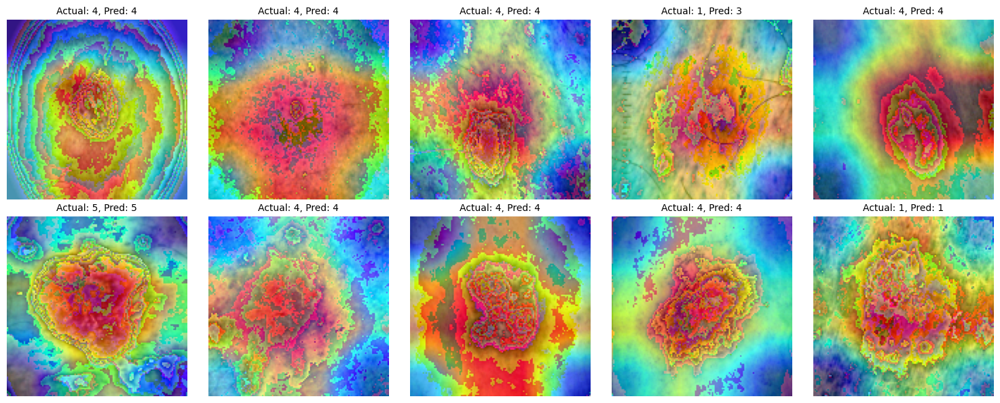

In [25]:
import torch
import torch.nn as nn
import torchvision.models as models
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchcam.methods import SmoothGradCAMpp  # Grad-CAM++
from torchvision.transforms.functional import to_pil_image

# Define MobileNetV2 Model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Unfreeze the last conv block (needed for Grad-CAM)
        for param in self.model.features[18].parameters():
            param.requires_grad = True

        # Modify classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)


# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7
model = MobileNetV2Model(num_classes=num_classes).to(device)

# Load Trained Weights
model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location=device))
model.eval()

# Grad-CAM Setup
target_layer = model.model.features[18][0] # Access correct Conv2d layer
cam_extractor = SmoothGradCAMpp(model.model, target_layer=target_layer)

# Select 10 Sample Images from the Validation Dataset
num_samples = 10
samples = [val_dataset[i] for i in range(num_samples)]  # Get first 10 images

# Plot
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 2 rows, 5 columns

for idx, (image, label) in enumerate(samples):
    input_tensor = image.unsqueeze(0).to(device)  # Add batch dimension

    # Forward pass
    output = model(input_tensor)
    prediction = torch.argmax(output, dim=1).item()

    # Generate Grad-CAM heatmap
    activation_map = cam_extractor(prediction, output)  # Grad-CAM for predicted class
    heatmap = activation_map[0].cpu().numpy()

    # Normalize heatmap
    heatmap = np.max(heatmap, axis=0)  # Max across channels
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-10)  # Normalize
    heatmap = np.uint8(255 * heatmap)  # Convert to uint8
    heatmap = cv2.applyColorMap(cv2.resize(heatmap, (128, 128)), cv2.COLORMAP_JET)

    # Convert tensor image to NumPy
    original_image = np.array(to_pil_image(image))

    # Overlay heatmap on original image
    overlayed_image = cv2.addWeighted(original_image, 0.5, heatmap, 0.5, 0)

    # Plot the image
    ax = axes[idx // 5, idx % 5]
    ax.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Actual: {label}, Pred: {prediction}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


# **XAI - SHAP**

# Example

<ipython-input-26-b23f88fb930b>:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location

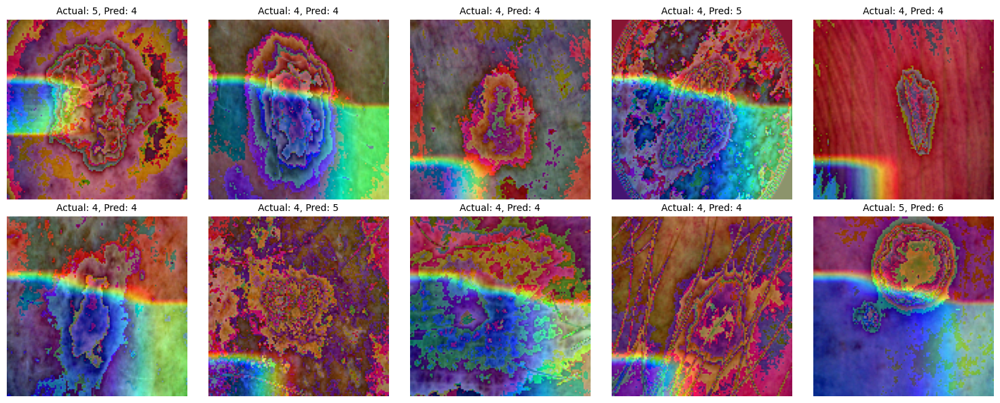

In [26]:
import torch
import torch.nn as nn
import torchvision.models as models
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchcam.methods import SmoothGradCAMpp  # Grad-CAM++
from torchvision.transforms.functional import to_pil_image
from torch.utils.data import DataLoader

# Define MobileNetV2 Model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Unfreeze the last few layers for fine-tuning
        for param in self.model.features[15:].parameters():  
            param.requires_grad = True

        # Match the classifier architecture of the saved model
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)  # Match original saved model
        )

    def forward(self, x):
        return self.model(x)



# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7
model = MobileNetV2Model(num_classes=num_classes).to(device)

# Load Trained Weights
model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location=device), strict=False)
model.eval()

# Grad-CAM Setup
# Corrected Grad-CAM Target Layer
target_layer = model.model.features[18][0]  # First Conv2D layer in last block
cam_extractor = SmoothGradCAMpp(model.model, target_layer=target_layer)


# DataLoader for Validation Dataset
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=True)
images, labels = next(iter(val_loader))  # Fetch a batch

# Forward pass
inputs = images.to(device)
outputs = model(inputs)


# Generate Grad-CAM heatmaps
predictions = torch.argmax(outputs, dim=1)  # Keep as tensor

# Generate Grad-CAM heatmaps for each sample
activation_maps = [cam_extractor(pred.item(), out.unsqueeze(0))[0] for pred, out in zip(predictions, outputs)]




# Plot
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 2 rows, 5 columns
for idx, (image, label, activation_map, pred) in enumerate(zip(images, labels, activation_maps, predictions)):
    #heatmap = activation_map.cpu().numpy()
    #heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-10)  # Normalize
    #heatmap = np.uint8(255 * heatmap)  # Convert to uint8
    #heatmap = cv2.applyColorMap(cv2.resize(heatmap, (image.shape[1], image.shape[2])), cv2.COLORMAP_JET)
    # Normalize heatmap properly
    heatmap = np.max(heatmap, axis=0)  # Reduce across channels
    heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap) + 1e-10)  # Normalize to [0, 1]

    # Convert to 8-bit integer (CV_8UC1 format)
    heatmap = (heatmap * 255).astype(np.uint8)

    # Ensure it's a 2D grayscale image before applying colormap
    if len(heatmap.shape) == 3:  # If extra dimensions exist
        heatmap = heatmap.squeeze()  # Remove extra channels

    # Apply OpenCV colormap
    heatmap = cv2.applyColorMap(cv2.resize(heatmap, (128, 128)), cv2.COLORMAP_JET)

    # Convert tensor image to NumPy
    original_image = np.array(to_pil_image(image))
    original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)  # Convert to BGR

    # Overlay heatmap
    overlayed_image = cv2.addWeighted(original_image, 0.5, heatmap, 0.5, 0)

    # Plot the image
    ax = axes[idx // 5, idx % 5]
    ax.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Actual: {label}, Pred: {pred}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


# **XAI - LIME**

In [27]:
pip install lime


Note: you may need to restart the kernel to use updated packages.


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

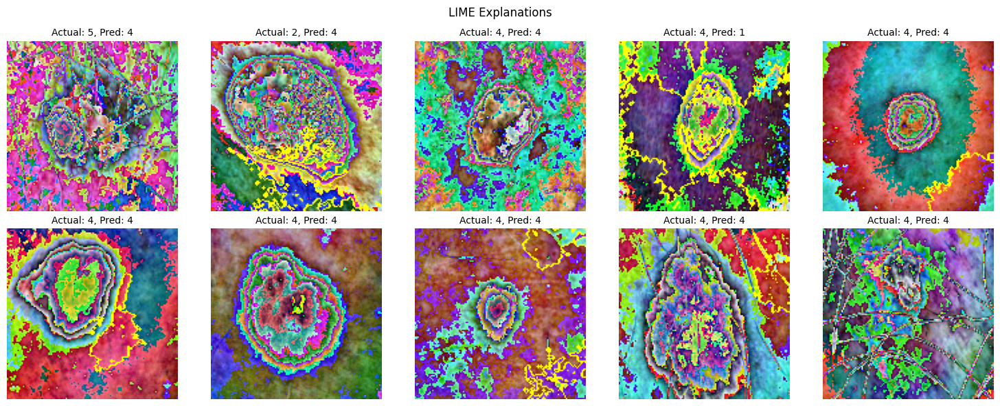

In [28]:
import torch
import torchvision.transforms as transforms
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
from torch.utils.data import DataLoader

# Define LIME Explainer
explainer = lime_image.LimeImageExplainer()

# Preprocessing Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Function to Predict Using Model
def model_predict(images):
    """Convert list of images into a batch and predict using the model."""
    batch = torch.stack([transform(Image.fromarray(img)) for img in images]).to(device)
    outputs = model(batch)
    probs = torch.nn.functional.softmax(outputs, dim=1).detach().cpu().numpy()
    return probs

# DataLoader to Fetch Random Samples
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=True)
images, labels = next(iter(val_loader))  # Fetch one random batch

# Convert Tensor Images to Numpy Array for LIME
numpy_images = [np.array(to_pil_image(img)) for img in images]

# Generate LIME Explanations
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle("LIME Explanations")

for idx, (image, label) in enumerate(zip(numpy_images, labels)):
    # Apply LIME to Each Image
    explanation = explainer.explain_instance(
        image, 
        model_predict,
        top_labels=1,
        hide_color=0,
        num_samples=1000
    )

    predicted_label = model_predict([image]).argmax()
    temp, mask = explanation.get_image_and_mask(
        label=predicted_label,
        positive_only=True,
        hide_rest=False,
        num_features=10,
        min_weight=0.05
    )

    # Plot LIME Explanation
    ax = axes[idx // 5, idx % 5]
    ax.imshow(mark_boundaries(temp, mask))
    ax.set_title(f"Actual: {label}, Pred: {predicted_label}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

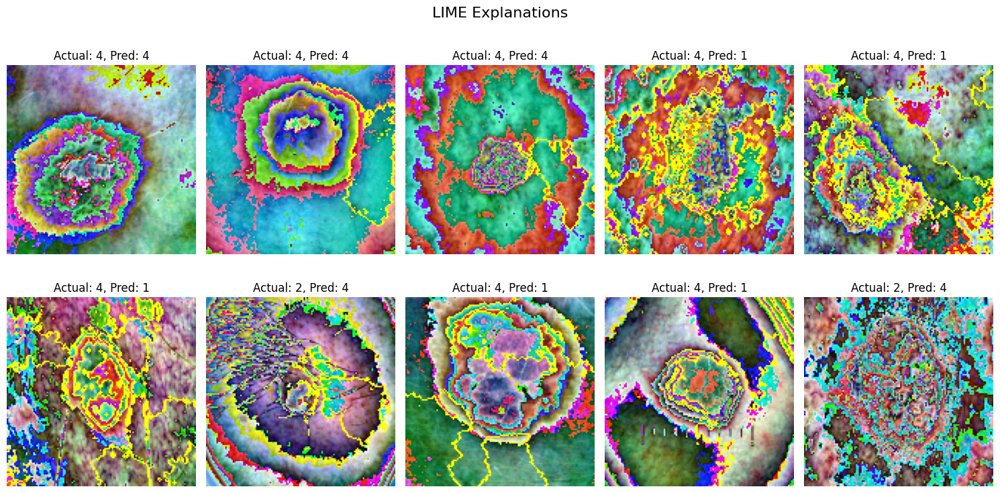

In [29]:
import torch
import torchvision.transforms as transforms
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
from torch.utils.data import DataLoader

# Define LIME explainer
explainer = lime_image.LimeImageExplainer()

# Define preprocessing function for LIME
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Function to predict using your trained model
def model_predict(images):
    """Convert list of images to a batch and return model predictions"""
    batch = torch.stack([transform(Image.fromarray(img)) for img in images]).to(device)
    outputs = model(batch)
    probs = torch.nn.functional.softmax(outputs, dim=1).detach().cpu().numpy()
    return probs

# DataLoader for validation dataset
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=True)

# Fetch one batch of random images
images, labels = next(iter(val_loader))

# Plotting setup
fig, axes = plt.subplots(2, 5, figsize=(15, 8))
fig.suptitle("LIME Explanations", fontsize=16)

# Loop through each image in the batch
for idx, image in enumerate(images):
    # Convert tensor image to NumPy array
    original_image = np.array(to_pil_image(image))
    
    # Apply LIME to the image
    explanation = explainer.explain_instance(
        original_image,
        model_predict,
        top_labels=1,
        hide_color=0,
        num_samples=1000  # Number of perturbations
    )

    # Get the predicted label
    predicted_label = model_predict([original_image]).argmax()

    # Extract the mask for the predicted class
    temp, mask = explanation.get_image_and_mask(
        label=predicted_label,
        positive_only=True,
        hide_rest=False,
        num_features=10,
        min_weight=0.05
    )

    # Plot the result
    ax = axes[idx // 5, idx % 5]
    ax.imshow(mark_boundaries(temp, mask))
    ax.set_title(f"Actual: {labels[idx].item()}, Pred: {predicted_label}")
    ax.axis("off")

plt.tight_layout()
plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

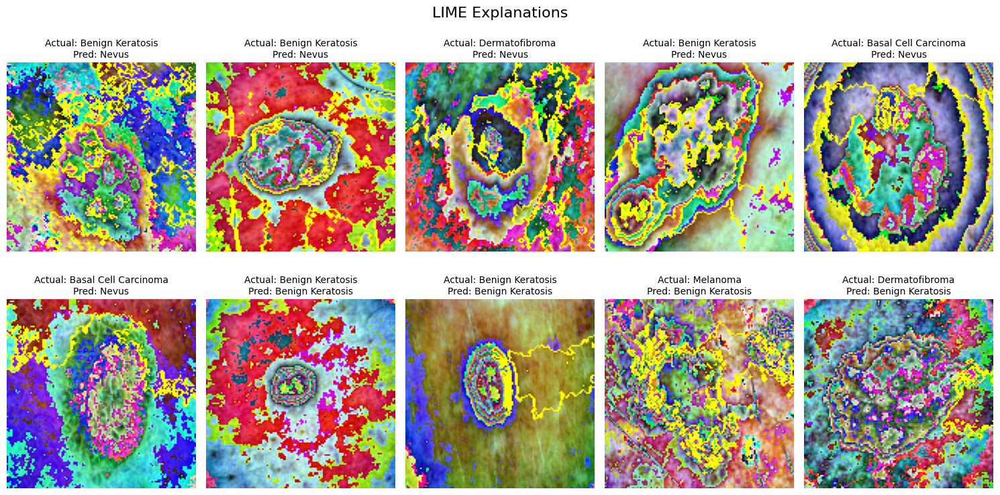

In [33]:
import torch
import torchvision.transforms as transforms
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
from torch.utils.data import DataLoader
from torchvision.transforms.functional import to_pil_image

# Define LIME explainer
explainer = lime_image.LimeImageExplainer()

# Define class labels for better readability
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"] # Modify based on dataset

# Define preprocessing function for LIME
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Function to predict using your trained model
def model_predict(images):
    """Convert list of images to a batch and return model predictions"""
    batch = torch.stack([transform(Image.fromarray(img)) for img in images]).to(device)
    outputs = model(batch)
    probs = torch.nn.functional.softmax(outputs, dim=1).detach().cpu().numpy()
    return probs

# DataLoader for validation dataset
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=True)

# Fetch one batch of random images
images, labels = next(iter(val_loader))

# Convert tensor images to NumPy format
numpy_images = [np.array(to_pil_image(img)) for img in images]

# Plotting setup
fig, axes = plt.subplots(2, 5, figsize=(15, 8))
fig.suptitle("LIME Explanations", fontsize=16)

# Loop through each image in the batch
for idx, (image, label) in enumerate(zip(numpy_images, labels)):
    explanation = explainer.explain_instance(
        image, 
        model_predict,
        top_labels=1,
        hide_color=0,
        num_samples=1000  # Number of perturbations
    )

    predicted_label_idx = model_predict([image]).argmax()
    actual_label_name = class_names[label.item()]  # Convert label index to class name
    predicted_label_name = class_names[predicted_label_idx]  # Convert prediction to class name

    temp, mask = explanation.get_image_and_mask(
        label=predicted_label_idx,
        positive_only=True,
        hide_rest=False,
        num_features=10,
        min_weight=0.05
    )

    # Plot LIME Explanation with Class Names
    ax = axes[idx // 5, idx % 5]
    ax.imshow(mark_boundaries(temp, mask))
    ax.set_title(f"Actual: {actual_label_name}\nPred: {predicted_label_name}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
from torchcam.methods import SmoothGradCAMpp  # Grad-CAM++
from torchvision.transforms.functional import to_pil_image
from torch.utils.data import DataLoader

# Define class labels
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]

# Define MobileNetV2 Model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Modify classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7
model = MobileNetV2Model(num_classes=num_classes).to(device)

# Load Trained Weights
model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location=device))
model.eval()

# Grad-CAM Setup
target_layer = model.model.features[18]  # Last convolutional layer in MobileNetV2
cam_extractor = SmoothGradCAMpp(model.model, target_layer=target_layer)

# Define LIME explainer
explainer = lime_image.LimeImageExplainer()

# Define preprocessing function for LIME
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

def model_predict(images):
    """Convert list of images to a batch and return model predictions"""
    batch = torch.stack([transform(Image.fromarray(img)) for img in images]).to(device)
    outputs = model(batch)
    probs = torch.nn.functional.softmax(outputs, dim=1).detach().cpu().numpy()
    return probs

# Load 10 sample images
num_samples = 10
val_loader = DataLoader(val_dataset, batch_size=num_samples, shuffle=True)
images, labels = next(iter(val_loader))

# Forward pass
inputs = images.to(device)
outputs = model(inputs)
predictions = torch.argmax(outputs, dim=1)

# Generate Grad-CAM heatmaps
activation_maps = [cam_extractor(pred.item(), out.unsqueeze(0))[0] for pred, out in zip(predictions, outputs)]

# Generate LIME explanations
lime_explanations = []
for i in range(num_samples):
    original_image = np.array(to_pil_image(images[i]))
    explanation = explainer.explain_instance(
        original_image, 
        model_predict, 
        top_labels=3,  # Increase to ensure predicted label is included
        hide_color=0, 
        num_samples=1000  # Number of perturbations
    )
    predicted_label = predictions[i].item()
    
    # Ensure predicted label is in explanation
    if predicted_label not in explanation.top_labels:
        predicted_label = explanation.top_labels[0]
    
    temp, mask = explanation.get_image_and_mask(
        label=predicted_label, 
        positive_only=True, 
        hide_rest=False, 
        num_features=10, 
        min_weight=0.05
    )
    lime_explanations.append((temp, mask))

# Plot results
fig, axes = plt.subplots(3, num_samples, figsize=(15, 9))  # 3 rows (Original, Grad-CAM, LIME)
for idx in range(num_samples):
    original_image = np.array(to_pil_image(images[idx]))
    
    # Grad-CAM heatmap
    heatmap = np.max(activation_maps[idx].cpu().numpy(), axis=0)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-10)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(cv2.resize(heatmap, (224, 224)), cv2.COLORMAP_JET)
    resized_original = cv2.resize(cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR), (224, 224))
    overlayed_image = cv2.addWeighted(resized_original, 0.5, heatmap, 0.5, 0)
    
    # LIME explanation
    lime_image, lime_mask = lime_explanations[idx]
    lime_result = mark_boundaries(lime_image, lime_mask)
    
    # Plot images
    axes[0, idx].imshow(original_image)
    axes[0, idx].set_title(f"Actual: {class_labels[labels[idx].item()]}")
    axes[0, idx].axis("off")
    
    axes[1, idx].imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
    axes[1, idx].set_title(f"Grad-CAM (Pred: {class_labels[predictions[idx].item()]})")
    axes[1, idx].axis("off")
    
    axes[2, idx].imshow(lime_result)
    axes[2, idx].set_title("LIME Explanation")
    axes[2, idx].axis("off")

plt.tight_layout()
plt.show()

**example**


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-30-0874d82a2d65>:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for mo

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

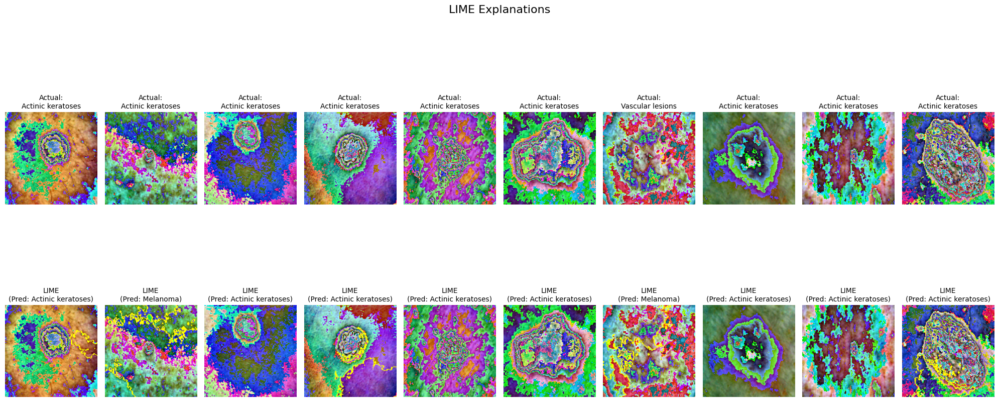

In [30]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
from torch.utils.data import DataLoader
from torchvision.transforms.functional import to_pil_image

# Define class labels
class_labels = ["Melanocytic nevi", "Melanoma", "Benign keratosis", "Basal cell carcinoma", "Actinic keratoses", "Vascular lesions", "Dermatofibroma"]

# Define MobileNetV2 Model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Modify classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7
model = MobileNetV2Model(num_classes=num_classes).to(device)

# Load Trained Weights
model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location=device))
model.eval()

# Define LIME explainer
explainer = lime_image.LimeImageExplainer()

# Define preprocessing function for LIME
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

def model_predict(images):
    """Convert list of images to a batch and return model predictions"""
    batch = torch.stack([transform(Image.fromarray(img)) for img in images]).to(device)
    outputs = model(batch)
    probs = torch.nn.functional.softmax(outputs, dim=1).detach().cpu().numpy()
    return probs

# Load 10 sample images
num_samples = 10
val_loader = DataLoader(val_dataset, batch_size=num_samples, shuffle=True)
images, labels = next(iter(val_loader))

# Generate LIME explanations
fig, axes = plt.subplots(2, num_samples, figsize=(20, 10))  # 2 rows (Actual, LIME)
fig.suptitle("LIME Explanations", fontsize=16)

for idx in range(num_samples):
    original_image = np.array(to_pil_image(images[idx]))
    explanation = explainer.explain_instance(
        original_image, 
        model_predict, 
        top_labels=3,  # Increase to ensure predicted label is included
        hide_color=0, 
        num_samples=1000  # Number of perturbations
    )
    predicted_label = np.argmax(model_predict([original_image]), axis=1)[0]
    
    # Ensure predicted label is in explanation
    if predicted_label not in explanation.top_labels:
        predicted_label = explanation.top_labels[0]
    
    temp, mask = explanation.get_image_and_mask(
        label=predicted_label, 
        positive_only=True, 
        hide_rest=False, 
        num_features=10, 
        min_weight=0.05
    )
    lime_result = mark_boundaries(temp, mask)
    
    # Plot original image
    axes[0, idx].imshow(original_image)
    # Adjusted titles for better readability
    axes[0, idx].set_title(f"Actual:\n{class_labels[labels[idx].item()]}", fontsize=10)
    axes[0, idx].axis("off")
    
    # Plot LIME result
    axes[1, idx].imshow(lime_result)
    axes[1, idx].set_title(f"LIME\n(Pred: {class_labels[predicted_label]})", fontsize=10)
    axes[1, idx].axis("off")

plt.tight_layout()
plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

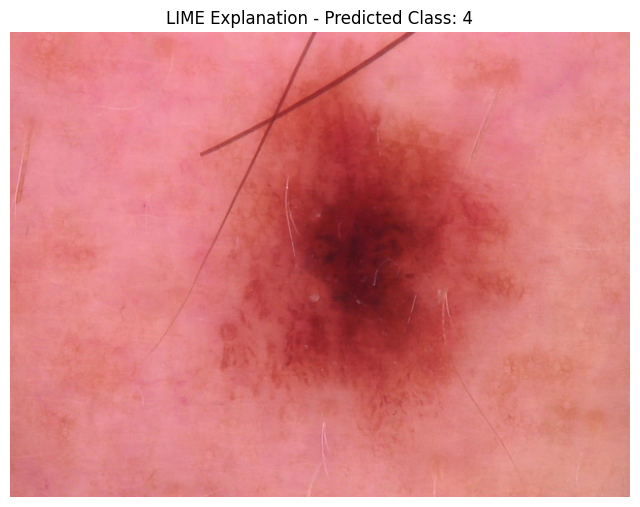

In [49]:
import torch
import torchvision.transforms as transforms
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image

# Define LIME explainer
explainer = lime_image.LimeImageExplainer()

# Define preprocessing function for LIME
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Function to predict using your trained model
def model_predict(images):
    """Convert list of images to a batch and return model predictions"""
    batch = torch.stack([transform(Image.fromarray(img)) for img in images]).to(device)
    outputs = model(batch)
    probs = torch.nn.functional.softmax(outputs, dim=1).detach().cpu().numpy()
    return probs

# Load and preprocess an image
image_path = "/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0024306.jpg"  # Change to your actual image path
original_image = cv2.imread(image_path)  # Load image using OpenCV
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Apply LIME to the image
explanation = explainer.explain_instance(
    original_image, 
    model_predict, 
    top_labels=1, 
    hide_color=0, 
    num_samples=1000  # Number of perturbations
)

# Get the explanation for the predicted class
predicted_label = model_predict([original_image]).argmax()
temp, mask = explanation.get_image_and_mask(
    label=predicted_label, 
    positive_only=True, 
    hide_rest=False, 
    num_features=10, 
    min_weight=0.05
)

# Display LIME explanation
plt.figure(figsize=(8, 8))
plt.imshow(mark_boundaries(temp, mask))
plt.title(f"LIME Explanation - Predicted Class: {predicted_label}")
plt.axis("off")
plt.show()


# **XAI - SHAP**

In [50]:
pip install shap


Note: you may need to restart the kernel to use updated packages.


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


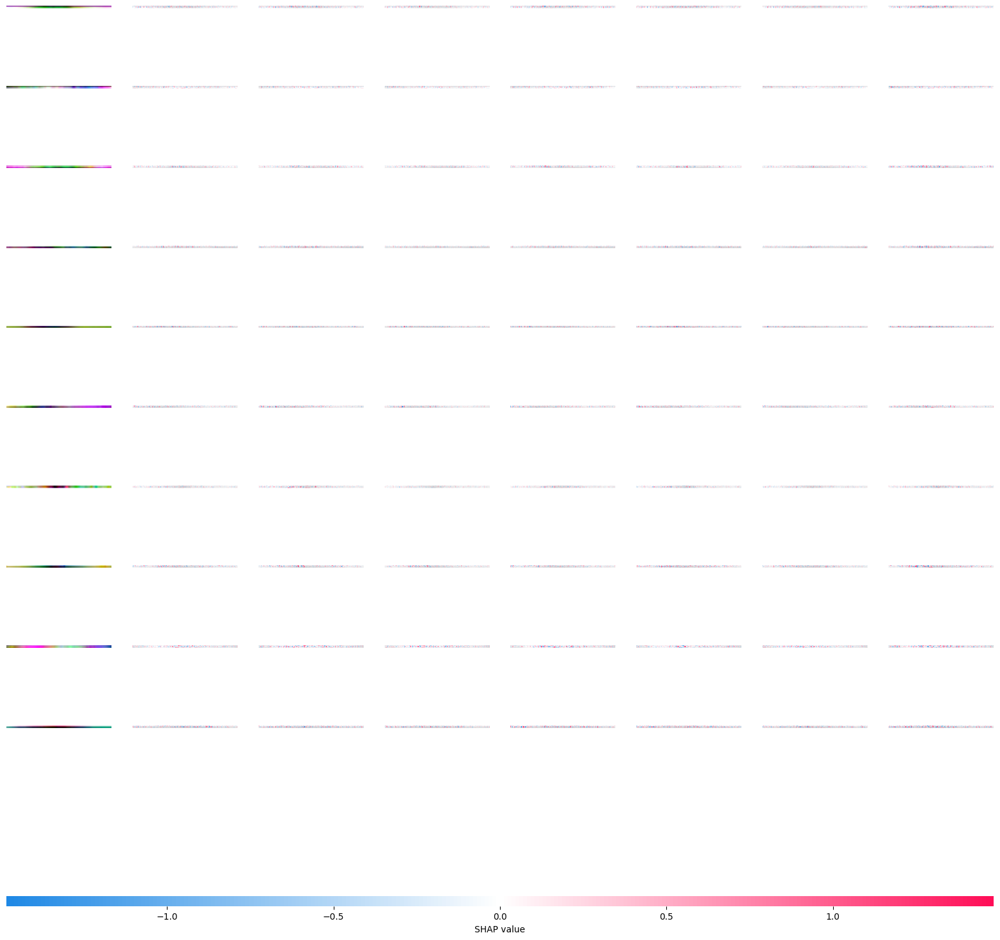

In [54]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import shap
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from PIL import Image

# Define MobileNetV2 Model
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Freeze feature extraction layers
        for param in self.model.features.parameters():
            param.requires_grad = False

        # Modify classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Load trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Change this if needed
model = MobileNetV2Model(num_classes=num_classes).to(device)
model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location=device))
model.eval()

# Define preprocessing function
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Load validation dataset (assuming it's already defined)
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=True)  # Get 10 random samples
samples = next(iter(val_loader))  # Extract a batch
images, labels = samples[0], samples[1]  # Unpack images & labels
images = images.to(device)

# Model prediction function for SHAP
def model_predict(x):
    x_tensor = torch.tensor(x, dtype=torch.float32).to(device)
    with torch.no_grad():
        return model(x_tensor).cpu().numpy()

# Select a smaller background dataset for SHAP
background = images[:5]  # Use first 5 images as background

# ✅ Fix: Use GradientExplainer instead of PermutationExplainer
explainer = shap.GradientExplainer(model, background)

# Explain the predictions for the batch
shap_values = explainer.shap_values(images)

# Visualize SHAP explanations
shap.image_plot(shap_values, images.cpu().numpy())


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


TypeError: Invalid shape (128, 3, 128) for image data

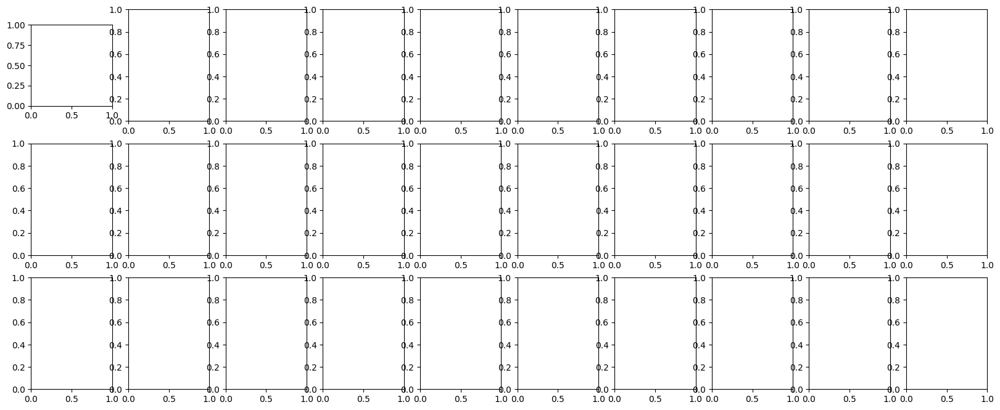

In [63]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import shap
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchcam.methods import SmoothGradCAMpp  # Grad-CAM++
from torchvision.transforms.functional import to_pil_image
from PIL import Image

# ===================== 🔥 Define MobileNetV2 Model =====================
class MobileNetV2Model(nn.Module):
    def __init__(self, num_classes):
        super(MobileNetV2Model, self).__init__()
        self.model = models.mobilenet_v2(pretrained=True)

        # Unfreeze last conv layer for Grad-CAM
        for param in self.model.features[18].parameters():
            param.requires_grad = True

        # Modify classifier
        in_features = self.model.classifier[1].in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# ===================== 🔥 Load Trained Model =====================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 7  # Adjust based on dataset
model = MobileNetV2Model(num_classes=num_classes).to(device)
model.load_state_dict(torch.load("/kaggle/working/mobilenet_skin_disease.pth", map_location=device))
model.eval()

# Ensure model requires gradients for SHAP
for param in model.parameters():
    param.requires_grad = True

# ===================== 🔥 Define Preprocessing =====================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Load validation dataset (assuming it's already defined)
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=True)  # Get 10 random samples
samples = next(iter(val_loader))  # Extract a batch
images, labels = samples[0], samples[1]  # Unpack images & labels
images = images.to(device)

# ===================== 🔥 Grad-CAM Setup =====================
target_layer = model.model.features[18][0]  # Last conv layer
cam_extractor = SmoothGradCAMpp(model.model, target_layer=target_layer)

# ===================== 🔥 SHAP Setup =====================
def model_predict(x):
    x_tensor = torch.tensor(x, dtype=torch.float32).to(device)
    with torch.no_grad():
        return model(x_tensor).cpu().numpy()

# Select background images for SHAP
background = images[:5]  # Use first 5 images
explainer = shap.GradientExplainer(model, background)

# Explain predictions for SHAP
shap_values = explainer.shap_values(images)

# ===================== 🔥 Visualization =====================
fig, axes = plt.subplots(3, 10, figsize=(20, 8))  # 3 rows: Original, Grad-CAM, SHAP

for idx, img_tensor in enumerate(images):
    input_tensor = img_tensor.unsqueeze(0).to(device)  # Add batch dimension

    # Forward pass
    output = model(input_tensor)
    prediction = torch.argmax(output, dim=1).item()

    # 🔥 Grad-CAM Heatmap
    activation_map = cam_extractor(prediction, output)  # Grad-CAM for predicted class
    heatmap = activation_map[0].cpu().numpy()  # Convert to NumPy
    heatmap = np.max(heatmap, axis=0)  # Max across channels
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-10)  # Normalize
    heatmap = np.uint8(255 * heatmap)  # Convert to uint8
    heatmap = cv2.applyColorMap(cv2.resize(heatmap, (224, 224)), cv2.COLORMAP_JET)

    # ✅ Ensure image has 3 channels
    original_image = np.array(to_pil_image(img_tensor))  # Convert tensor to NumPy
    if len(original_image.shape) == 2:  # If grayscale, convert to RGB
        original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB)

    # ✅ Ensure heatmap and original image are the same size
    heatmap = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))

    # ✅ Overlay heatmap on original image
    overlayed_image = cv2.addWeighted(original_image, 0.5, heatmap, 0.5, 0)

    # ✅ Fix SHAP Visualization
    shap_values_sum = np.sum(shap_values[idx], axis=0)  # Sum across channels

    # Plot Original Image
    # ✅ Fix image shape before plotting
    axes[0, idx].imshow(np.transpose(original_image, (1, 2, 0)))  # Convert (H, C, W) → (H, W, C)
    axes[0, idx].set_title(f"Actual: {labels[idx]}, Pred: {prediction}", fontsize=10)
    axes[0, idx].axis("off")

    # Plot Grad-CAM
    axes[1, idx].imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
    axes[1, idx].set_title("Grad-CAM", fontsize=10)
    axes[1, idx].axis("off")

    # Plot SHAP Explanation
    # ✅ Fix SHAP Visualization
    axes[2, idx].imshow(np.transpose(shap_values_sum, (1, 2, 0)), cmap="coolwarm")
    axes[2, idx].set_title("SHAP", fontsize=10)
    axes[2, idx].axis("off")

plt.tight_layout()
plt.show()
